# Multi-Person Wearable Data Collection: Chrome Extension for Fitbit



<img src="https://i.imgur.com/xO3Efdp.jpeg" width="500">

_A picture of the Fitbit Charge 6 that was used for this notebook_

## Introduction

### **Purpose of the Extension**

The **Wearipedia Extension** is designed as a multi-person data extraction tool that enables clinical researchers to collect authentication and access tokens to their study participant's wearable device data. This extension streamlines data collection processes, ensuring secure and efficient storage within Firebase, and provides researchers with tools to manage and monitor participant data effectively. While the tool is designed to collect data from various wearable devices, for simplicity of this notebook guide, we will use Fitbit Charge 6 as our primary wearable device.


### **Core Functionalities**

The extension offers core functionalities tailored for both researchers and participants:

**1. Streamlined Multi-Person Data Extraction**:

Researchers can efficiently gather data from multiple participants by sending email invitations that guide participants through a simple setup process. This method enables seamless onboarding and consistent data flow from each participant.

**2. HIPAA-Compliant Authentication System:**

The extension ensures participant data security and privacy through a **HIPAA-compliant** authentication system. This robust authentication protocol upholds strict data privacy standards, making it suitable for clinical and research applications requiring high levels of data protection.

This notebook is divided into **two** main sections: **1. Wearipedia Extension Setup and Demo** and **2. Multi-Person Data Extraction and Analysis Guide.**

The notebook is structured in such a way to provide step-by-step approach that guides researchers through the process of setting up and using the Wearipedia Extension for data collection and analysis.

## **Section 1: Wearipedia Extension Setup and Demo**

This section covers all essential setup tasks, providing researchers with the tools and knowledge needed to configure the Wearipedia Extension and prepare Firebase for secure data handling. Afterwards, it demonstrates the core functionalities and features used with a sample testing account. The following is an outline of all the steps:

**1.1 Install the Extension**

**1.2 Account and Firebase Project Setup**
*   Sign up and create an account
*   Firebase project setup and configuration
*   Create single-field index for Firestore

**1.3 Firebase Configuration and Initialization**

*  Detailed Firebase settings
*  Initializing the database connection

**1.4 Researcher Dashboard Overview**

*   Navigating the dashboard features
*   Adding and managing study participants
*   Sending email invitations
*   Collecting Fitbit tokens from participants

## **Section 2: Multi-Person Data Extraction and Analysis Guide**

This section focuses on data extraction and analysis when dealing with multiple participants that resemble real-life clinical study. Key elements include:

**2.1 Import Libraries for Setup**

**2.2 Configuring Parameters for Data Extraction**

**2.3 Multi-Person Data Extraction**
*  Guidelines for extracting data from multiple participants

**2.4 Exporting Data**
*  Export options: CSV, Excel, JSON

**2.5 Adherence Analysis**
*  Plotting adherence using block plots

**2.6 Basic Data Visualization**
*  Visualizing data with preliminary plots

**2.7 Advanced Visualization**
*  More sophisticated data visualization using Plotly Express

**2.8 Outlier Detection with Advanced Statistics**
*  Outlier detection of both individual-level and population-level using advanced statistical methods

**2.9 Population-level Data Analysis**
*  Sleep apnea detection using SPO2 and breathing rate data
*  Breathing rate distributions across sleep stages

## **Section 1: Wearipedia Extension Setup and Demo**

**This section is intended for clinical study coordinators.** This section is designed to guide you through setting up Firebase project, configuring your own Firebase project to the extension, and initiating data collection process from participants.

### **Prerequisites**

Before you begin, ensure you have the following:

- **Participant Emails:** A list of email addresses for all participants you wish to enroll.
- **Google Chrome Browser:** The chrome extension is compatible with Google Chrome browser.

### **1.1 Install the Extension**

First, download the [Wearipedia extension in Chrome Webstore](https://chromewebstore.google.com/search/Stanford%20Wearipedia%20Fitbit%20Authorization).

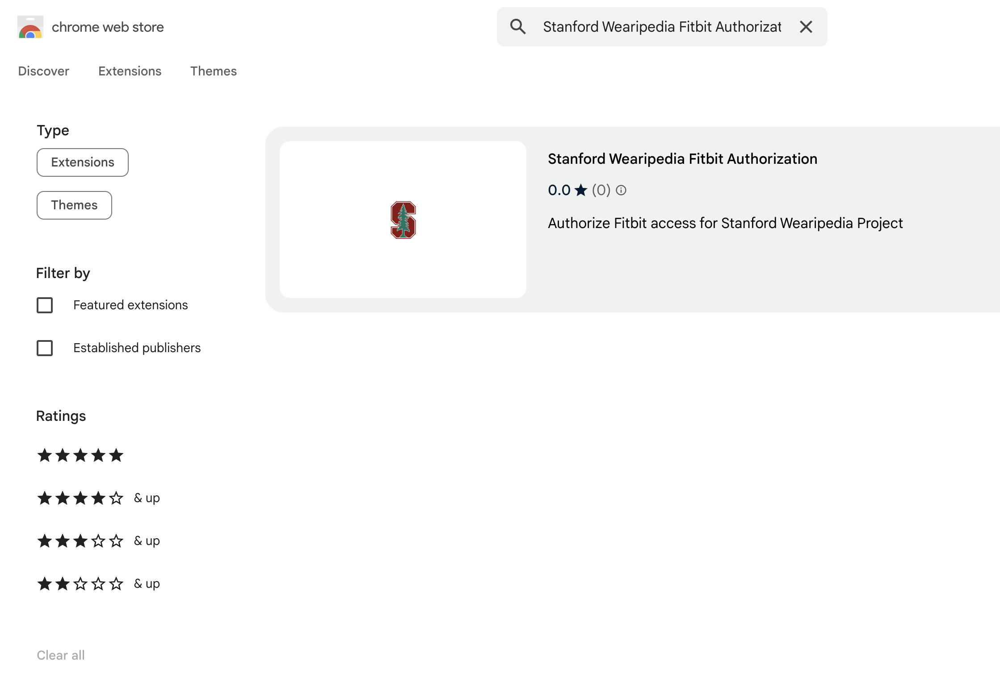

Once you have downloaded the extension and clicked on it, you will see the following page.

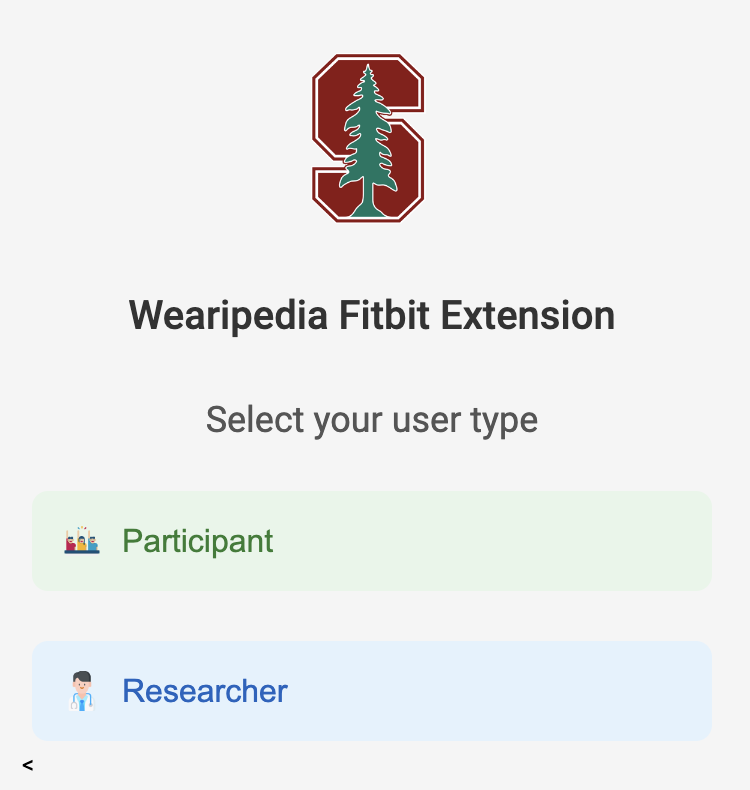

### **1.2 Account and Firebase Project Setup**

Since we are primarily concerned about the researcher flow, click the "**Researcher**" Button.

You will be directed to register a new researcher acccount with your email and password.

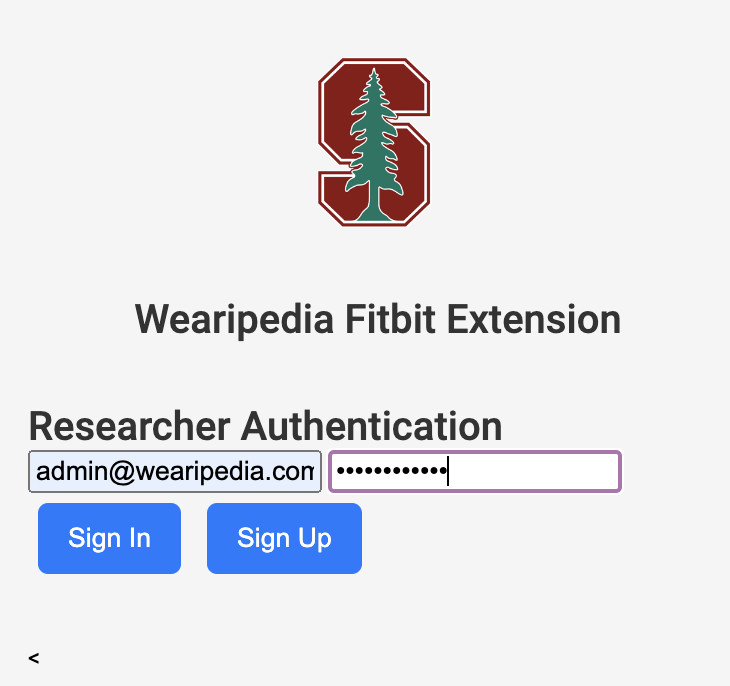

After you signed-up, you will be prompted to provide your Firestore configuration details. 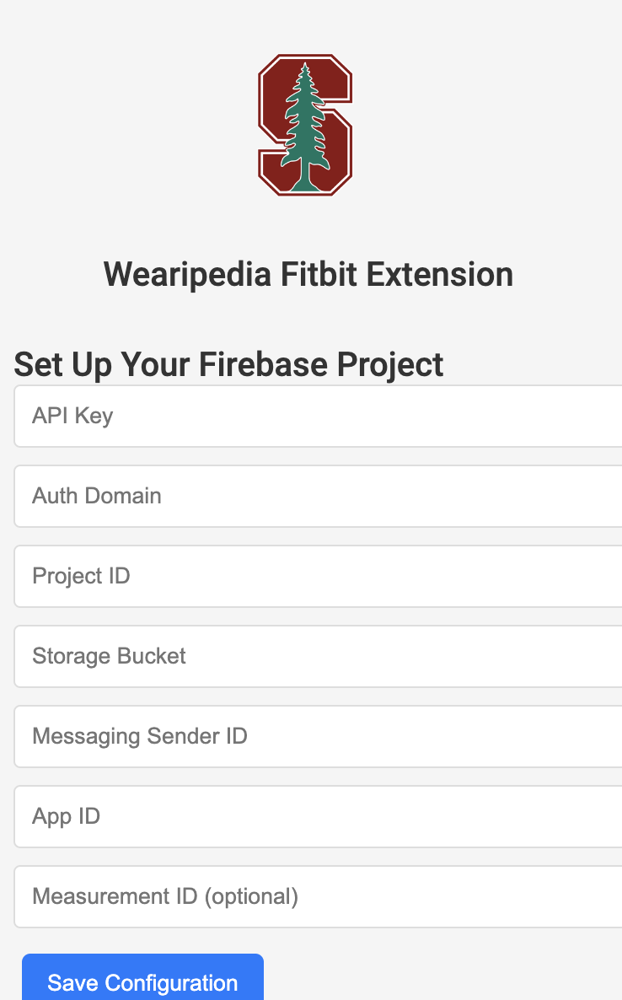

To provide the firebase project configuration details, we need to set up a
new firebase project. Proceed to [Firebase website](https://firebase.google.com/).
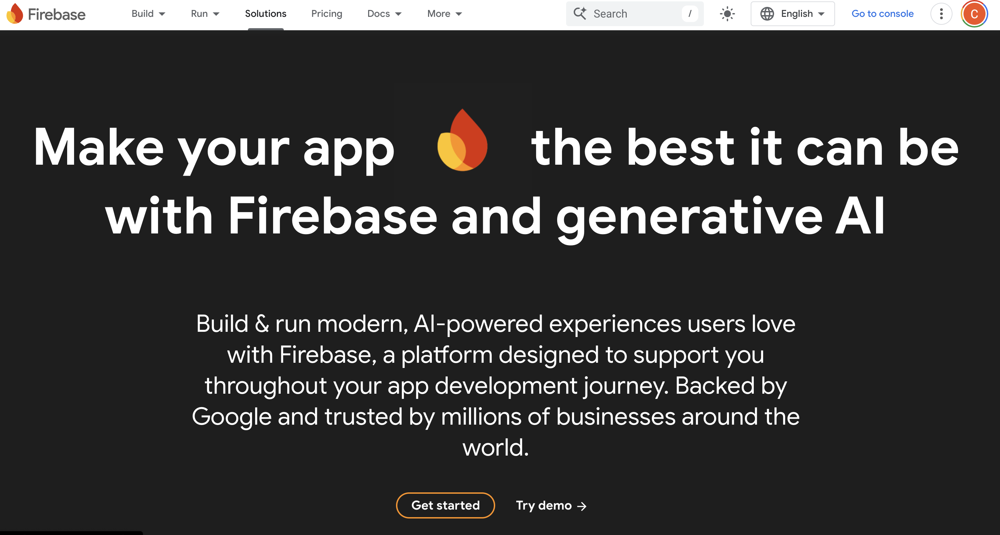

Click "**Go to console**" on the top right side of the page.

Then, click "**Get started with a Firebase project**"

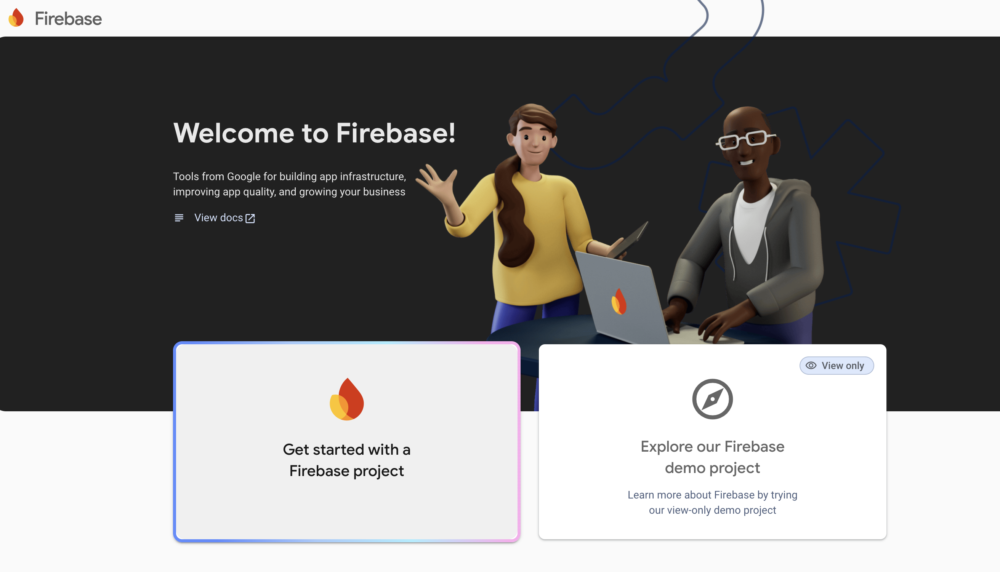

Then create a project with your preferred title for the project. For this notebook, we will create a sample tester project.

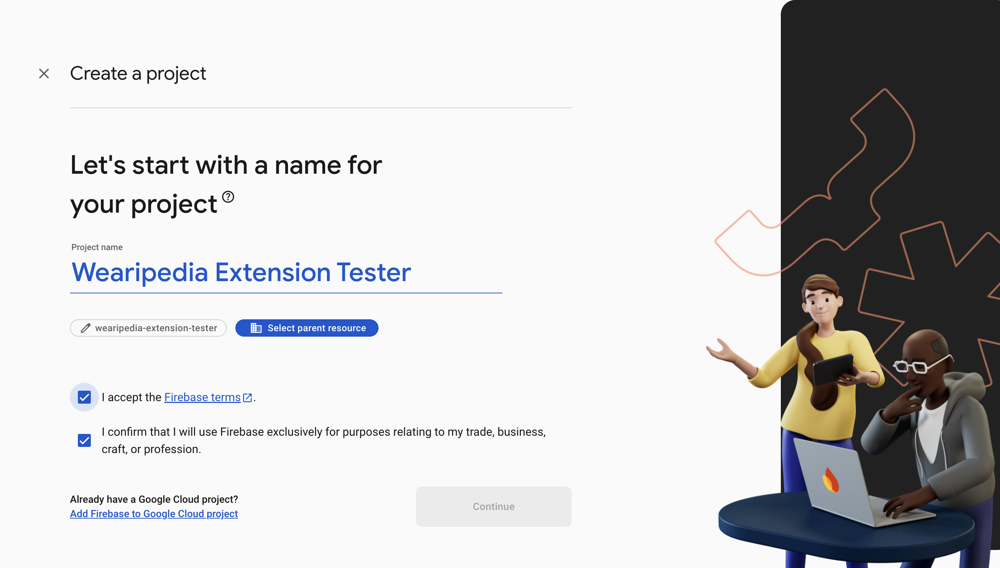



Press "**Create project**"

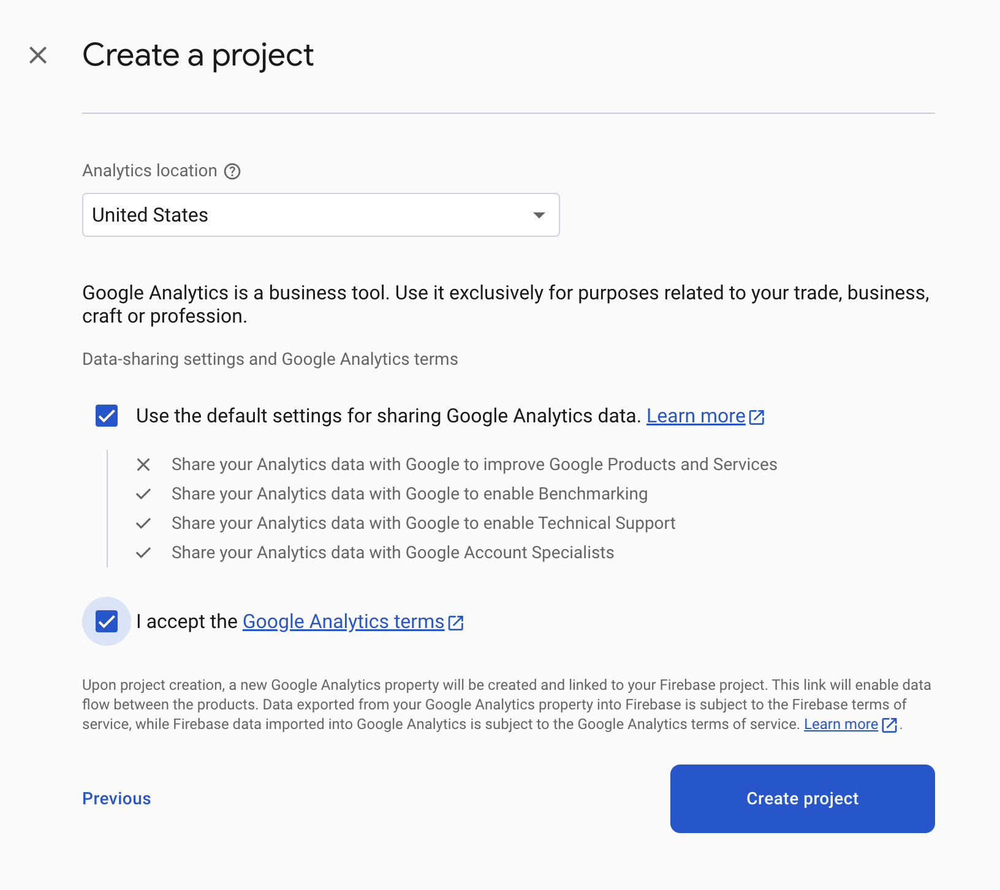

Once you are in the created project, then click "**Build**" and "**Firestore Database**" under the list.

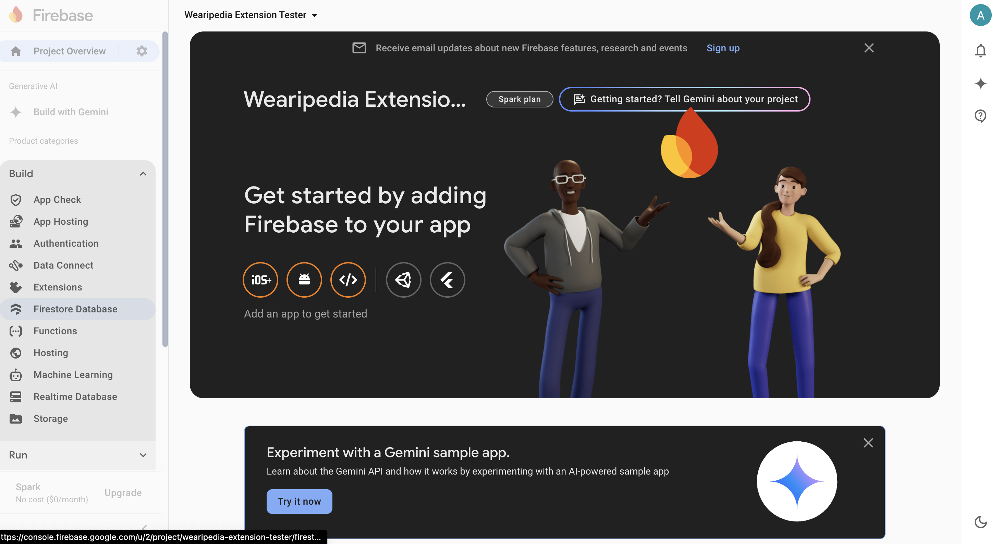

click "**Create database**"
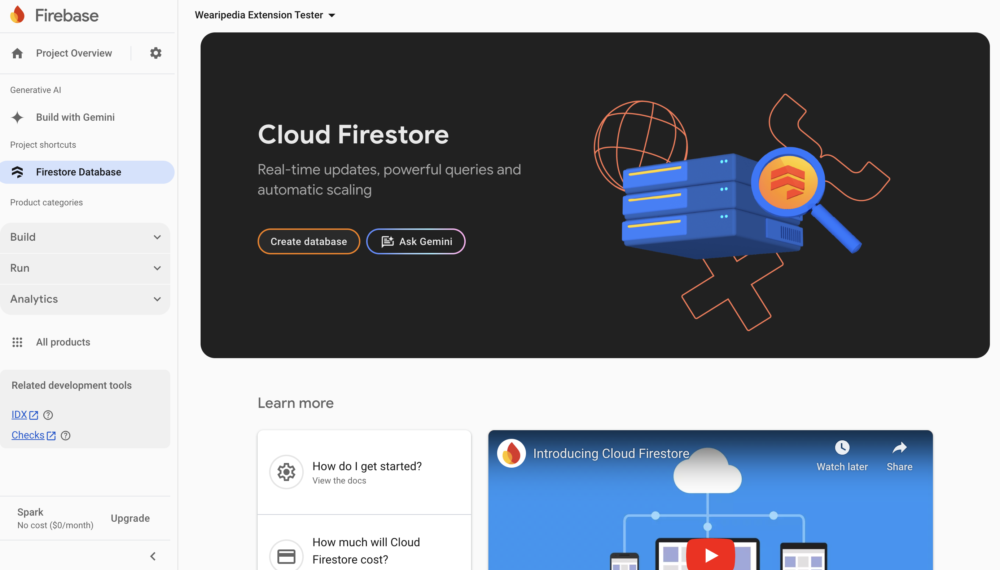

Select "**test mode**"

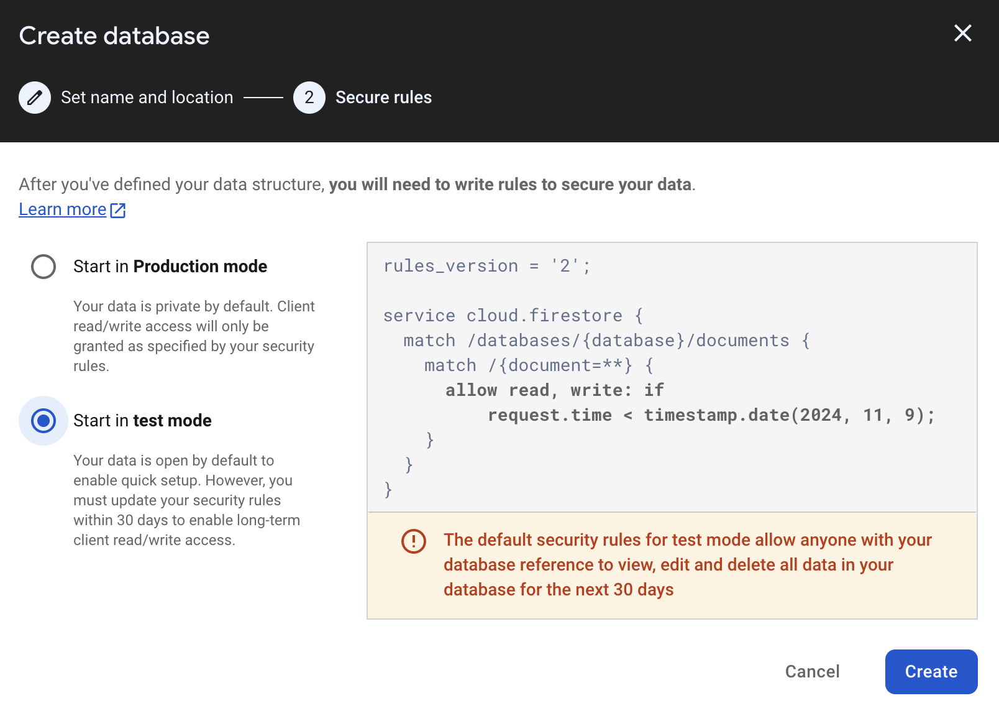

### Creating a Sample Study Database schema

For the purpose of this demonstration, we will design a sample study database schema as the following:

**studies** (collection)
- **studyId** (document)
  - `studyName`: *string*
  - **participants** (subcollection)
    - **participantId** (document)
      - `name`: *string*
      - `email`: *string*
      - `participantCode`: *string*
      - `lastSyncDate`: *timestamp*
      - `authorizationStatus`: *boolean*
      - `fitbitAccessToken`: *string*
      - `fitbitRefreshToken`: *string*

Click "**Start collection**" on the left of the cloud firestore page

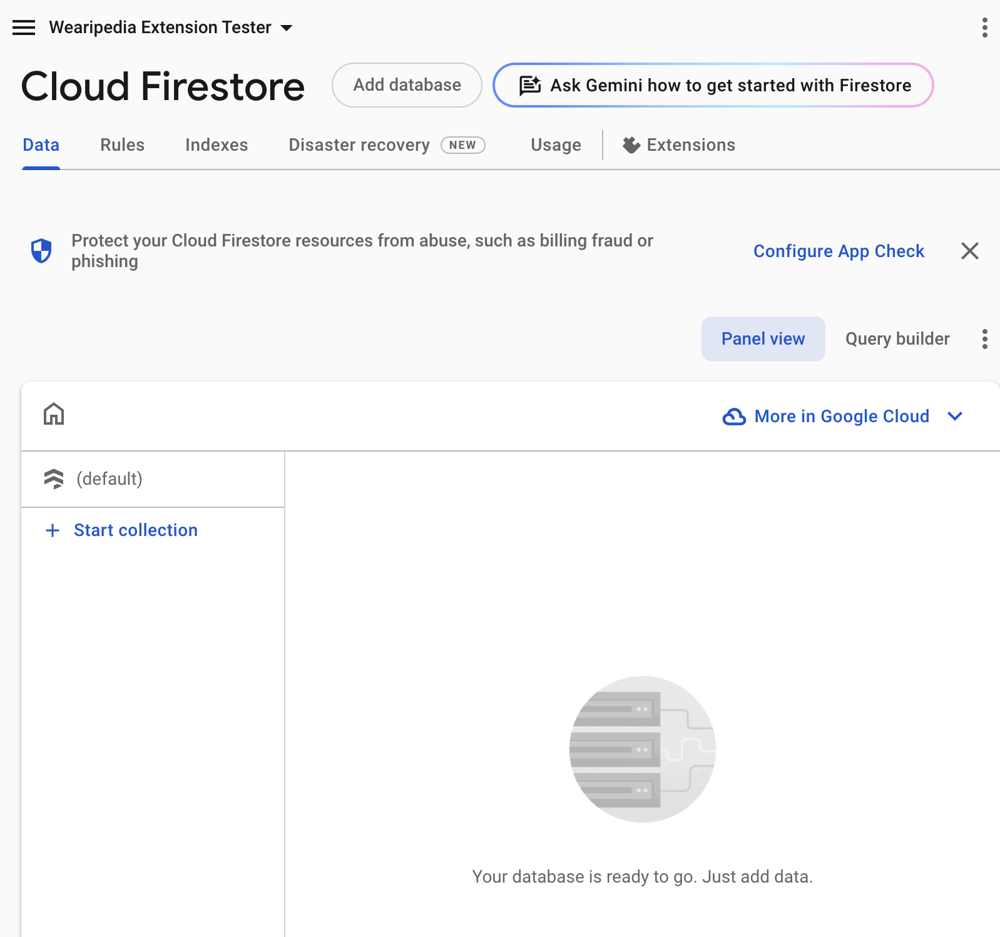

Set the Collection ID as "**studies**"
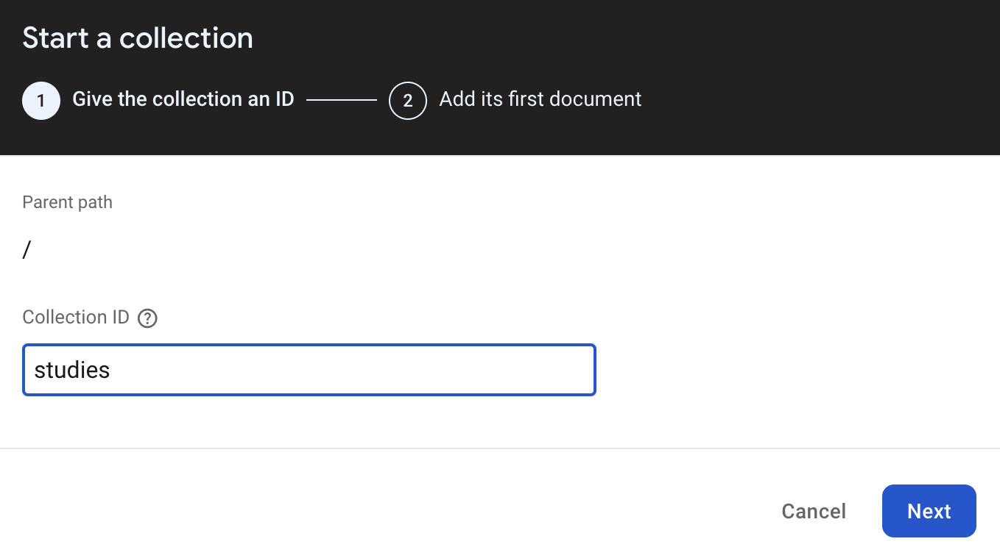

Then fill out the rest of the section as shown below:

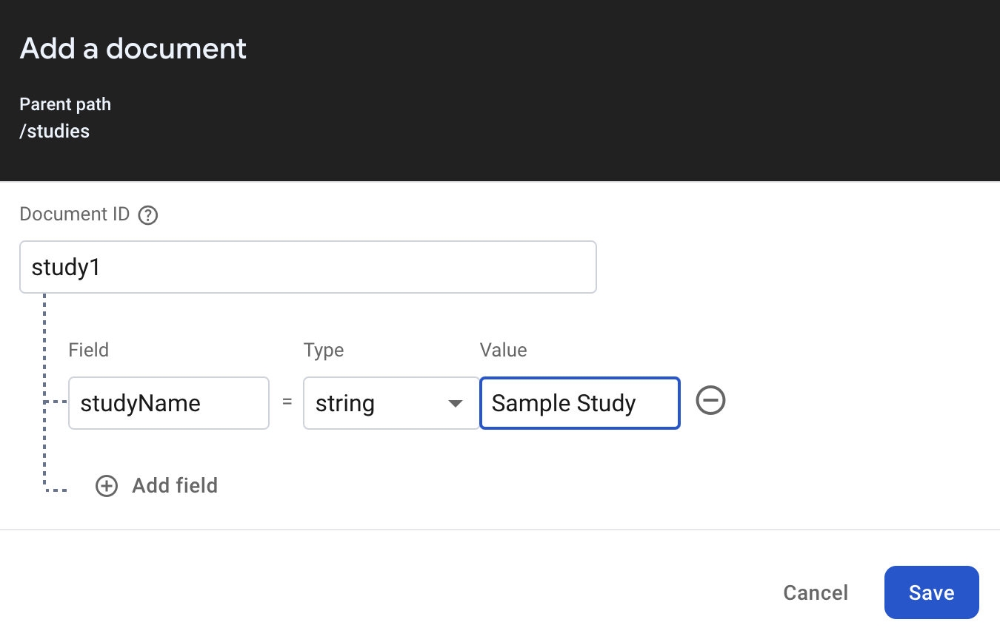

Then click the "**start collection**" under "**study1**" to create a subcollection

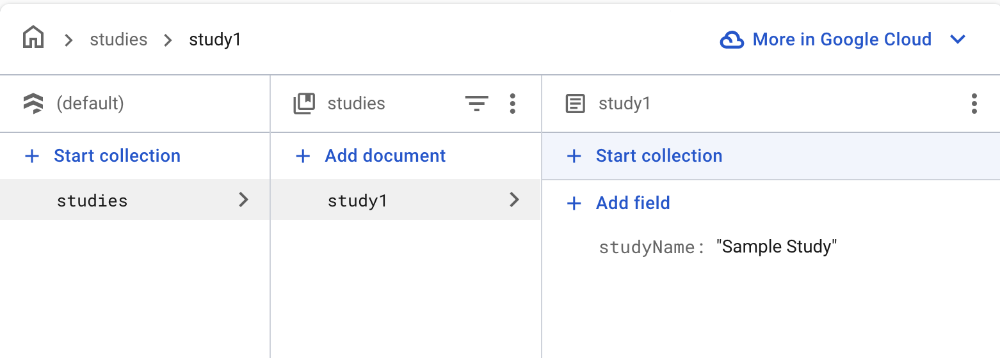

Create "**participants**" subcollection.

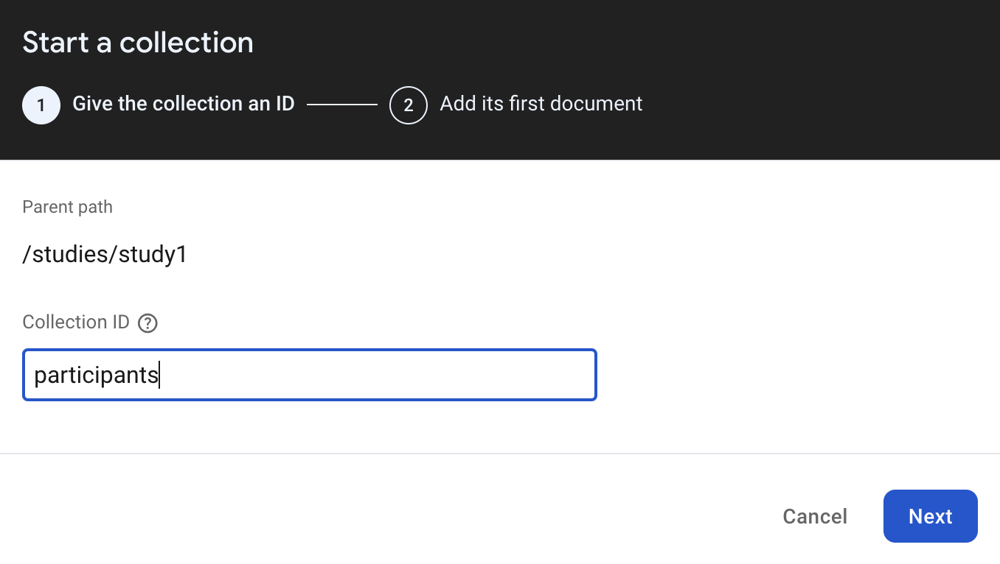

Then, fill out the fields of "**participant1**" as described in the schema. For your email and name, use any tester email and name accessible to you.

Then leave the value of the rest of the fields empty.

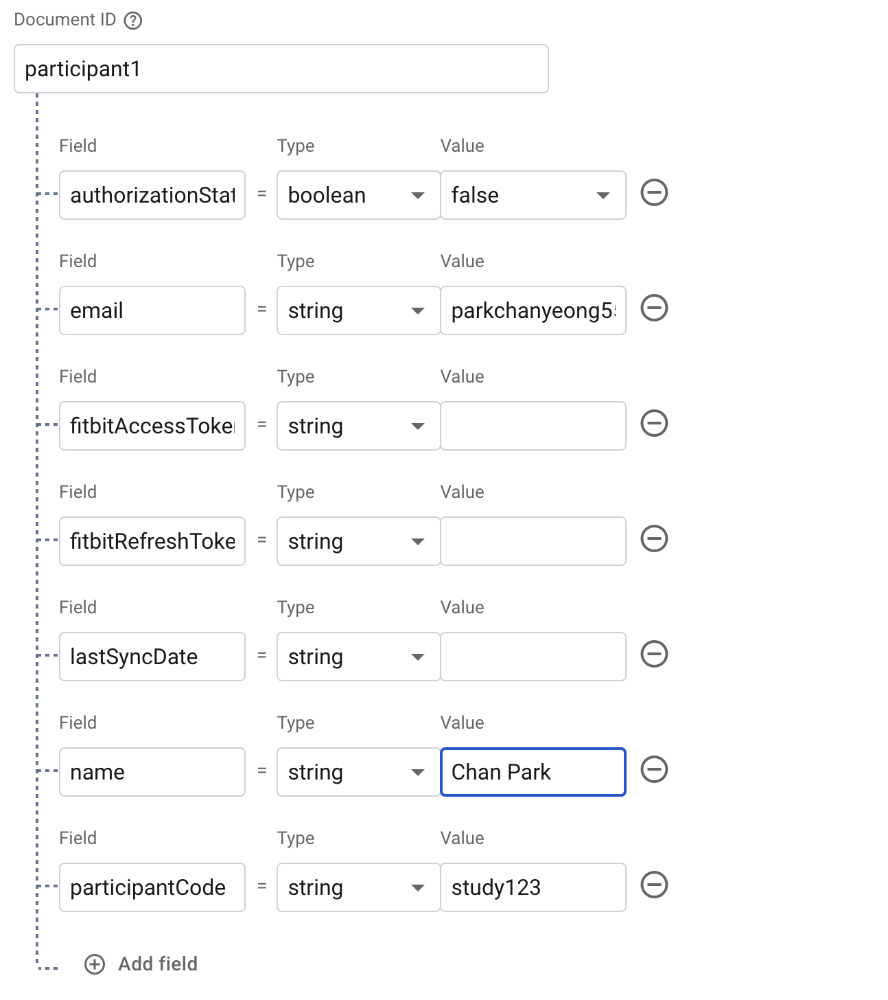

To enable efficient participant code verification, it is necessary to create an additional single-field index in the Firebase database. This index allows us to use the CollectionGroup query, which enables searches across all collections within a specified group, making participant verification faster and more scalable. To set this up, navigate to the "**Indexes**" section in Firebase, select "**Single Field**".

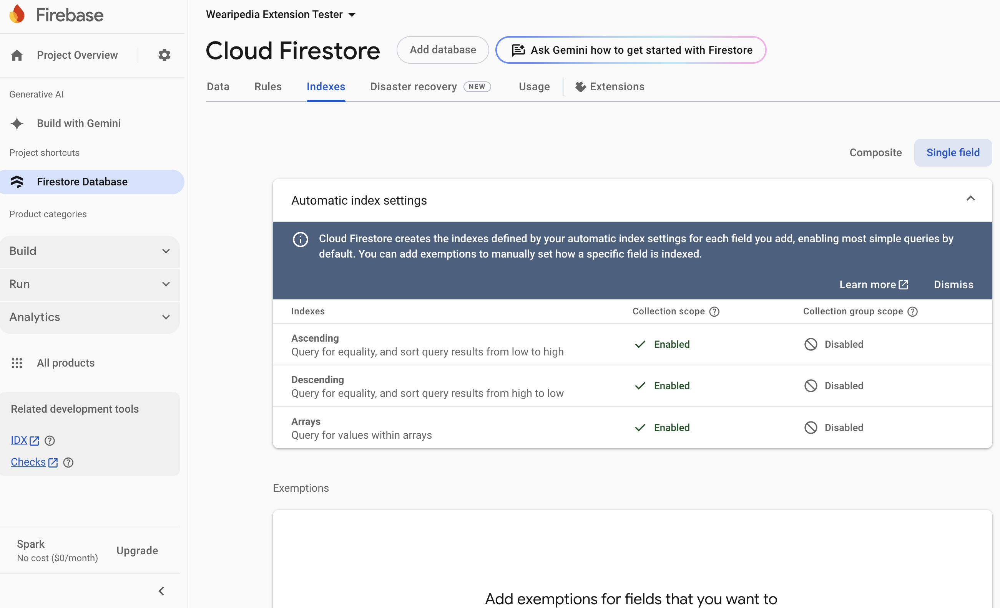

Then click "**add exemption**"

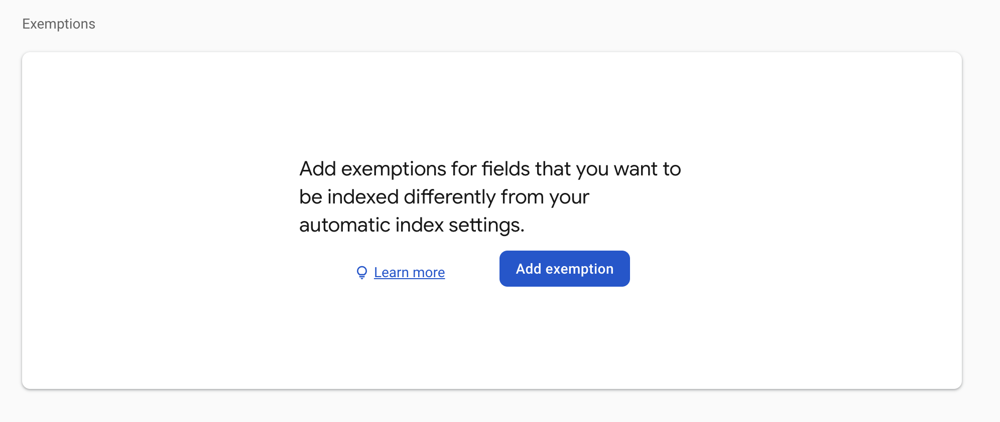

Create exemption like the following:

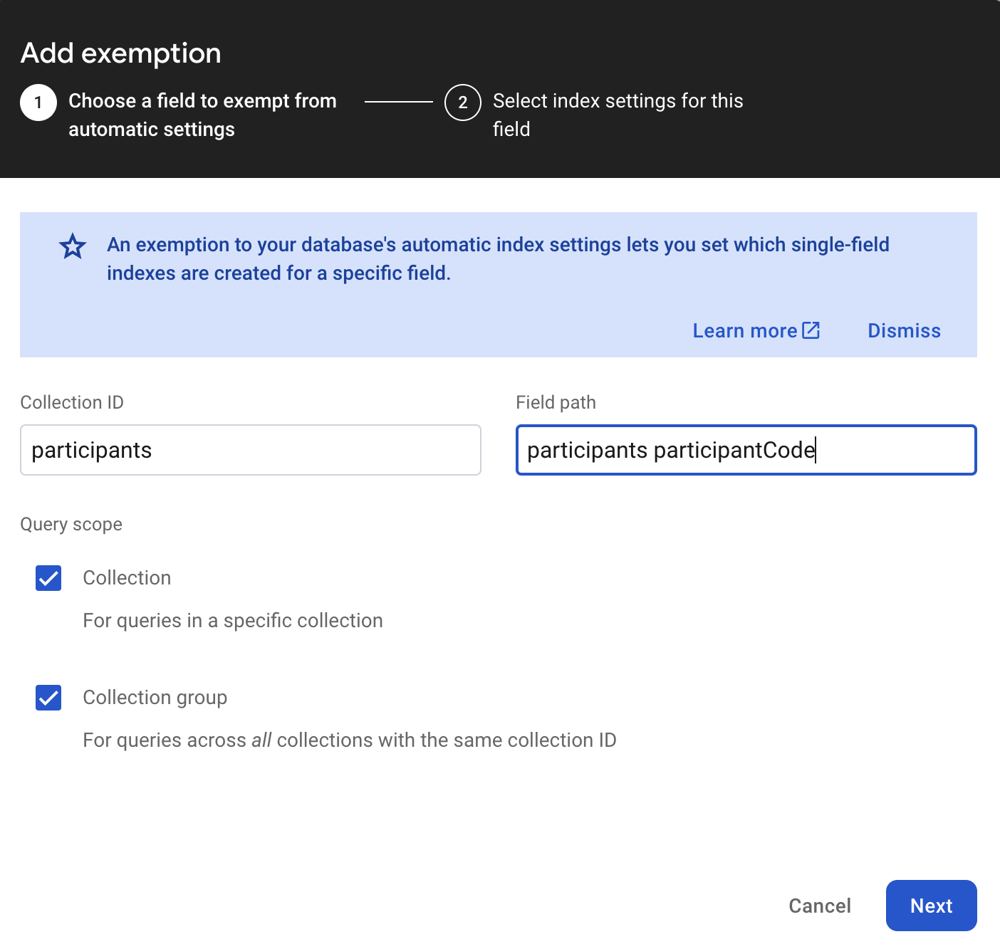

After creating the index, it should look like this:

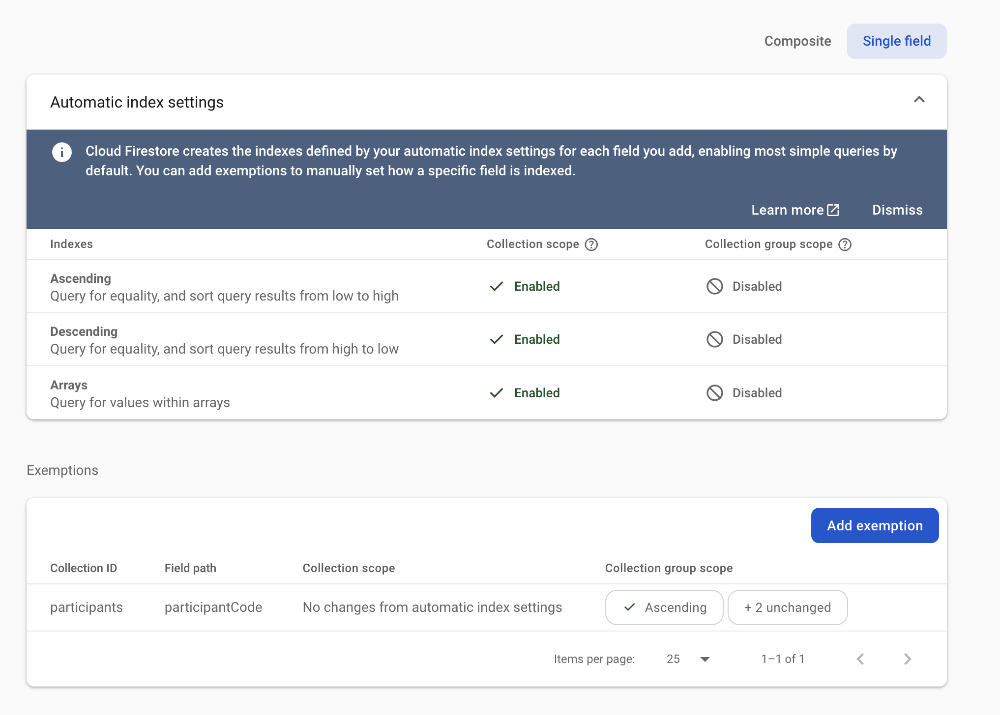

Now, select "**Setting**" -> "**Project Setting**"

As you scroll down to the "**Your Apps**" section, you will see your web app's Firebase configuration:

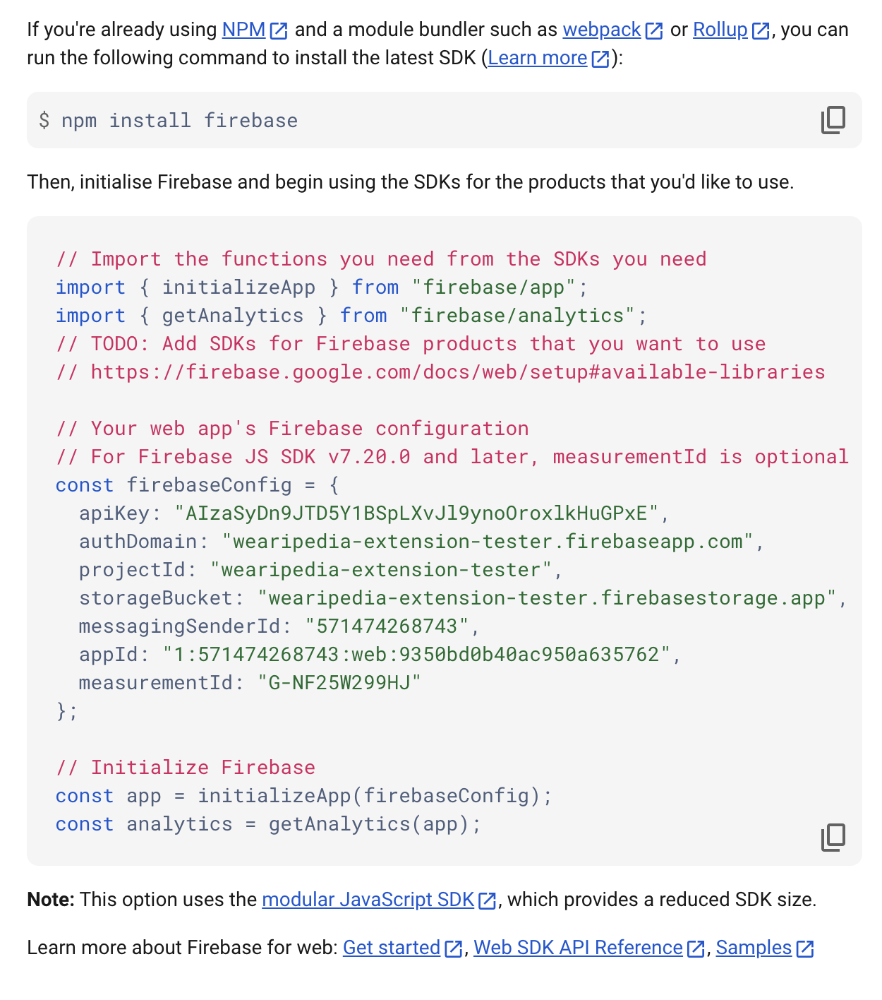

Copy and paste the configuration details in the extension page:

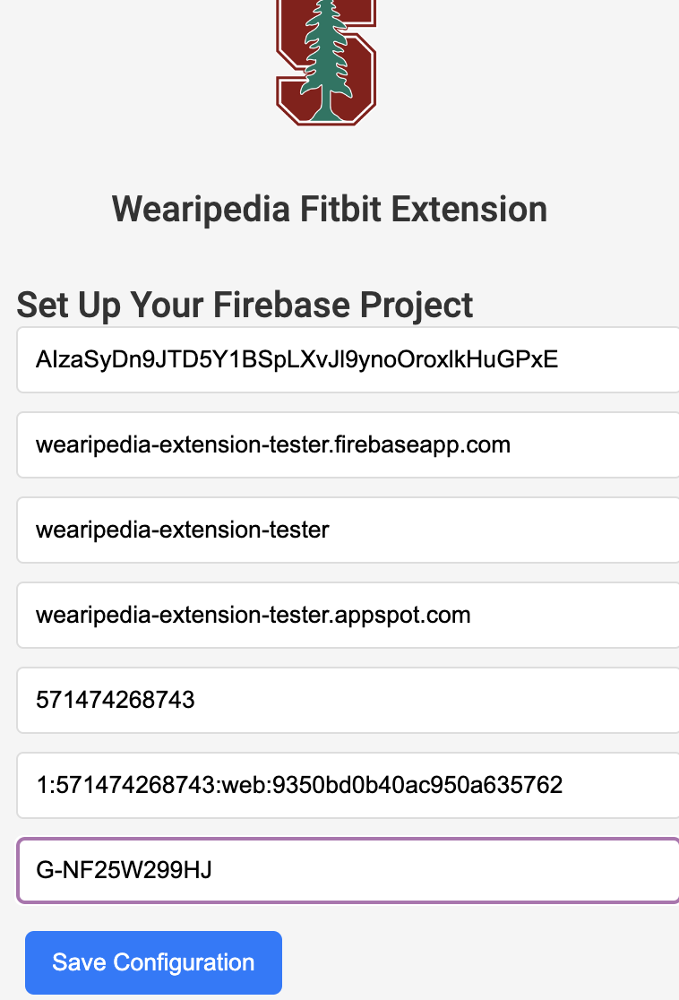

After you press "**Save Configuration**," you will be directed to the researcher dashboard page, where you will be able to see your firebase project lists

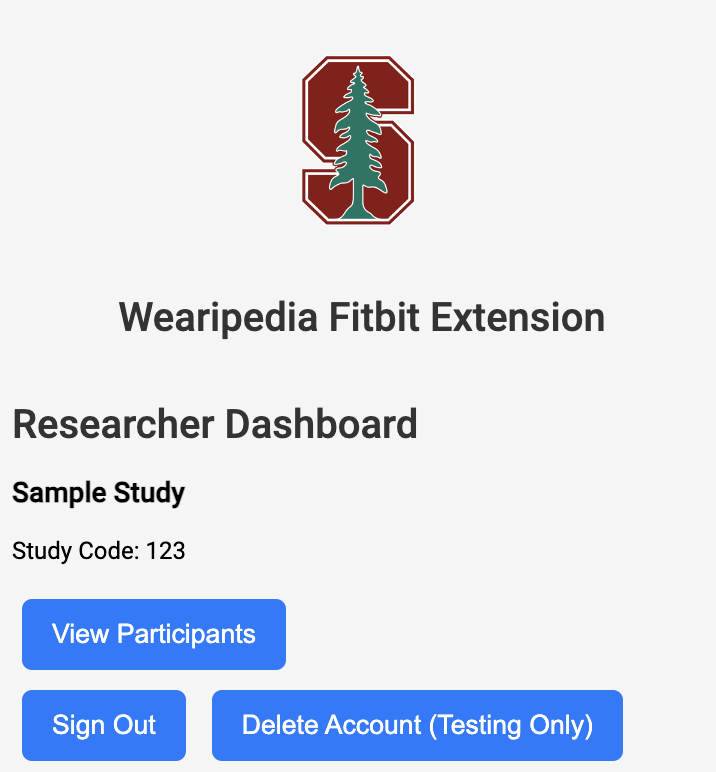

Select "**View Participants**" button to see the list of participants in your study 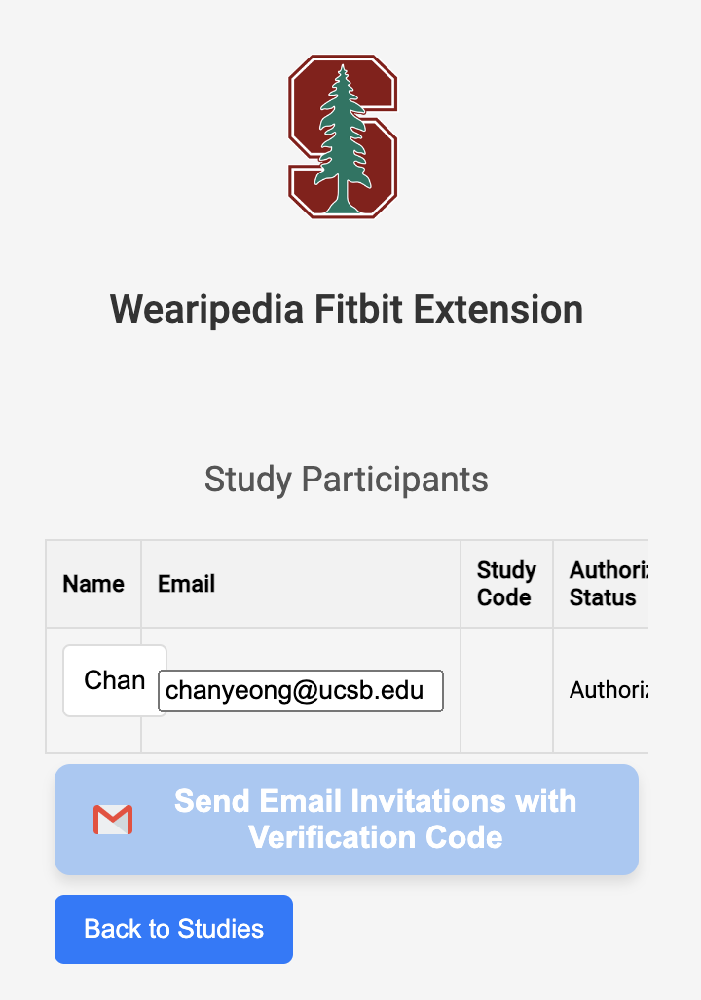

Click "**Send Email Invitations with Verification Code.**" This will lead you to the email template window to select which email template you will use. You can opt to draft your custom email template or use the default template.

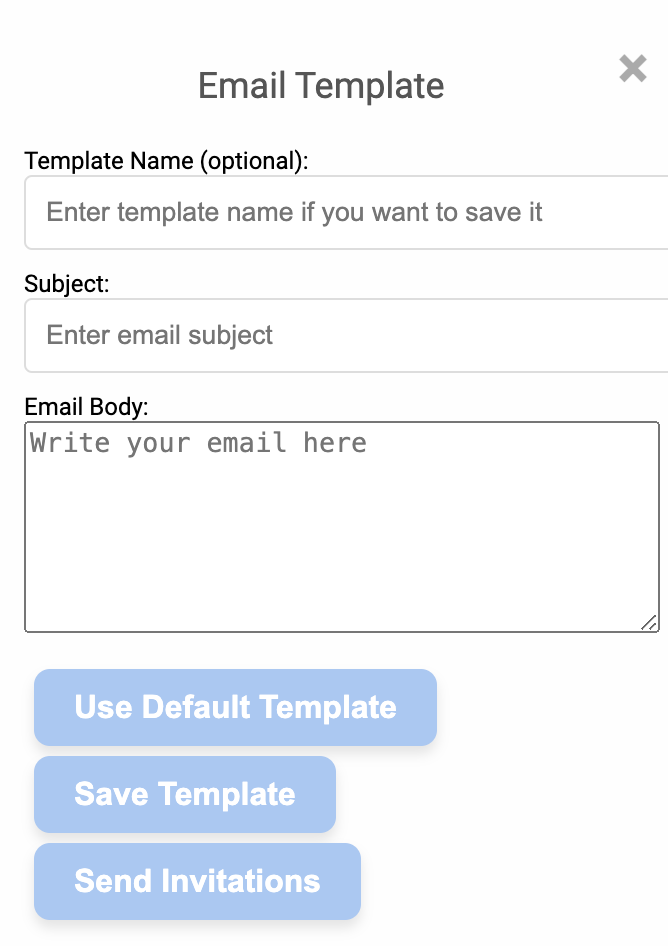



For the purpose of this demo, we will use the default template. After selecting default email template, the following email will be sent to all of your study participants:

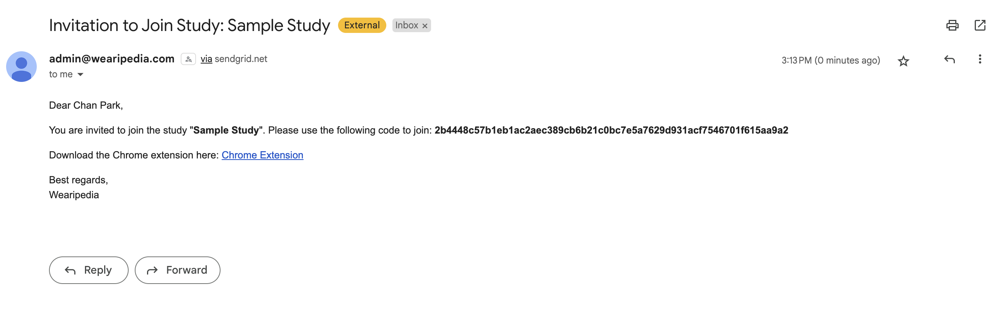

Once the participants follow the instructions and authenticate their fitbit access using the code generated, it will send a notification email to you regarding the participant's completion of data authorization

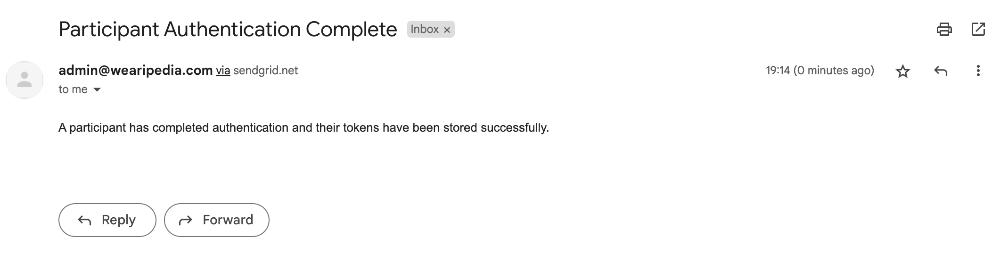

The participant's wearable access token and refresh tokens will be securely stored in your Firebase project, available for you to access their wearable data

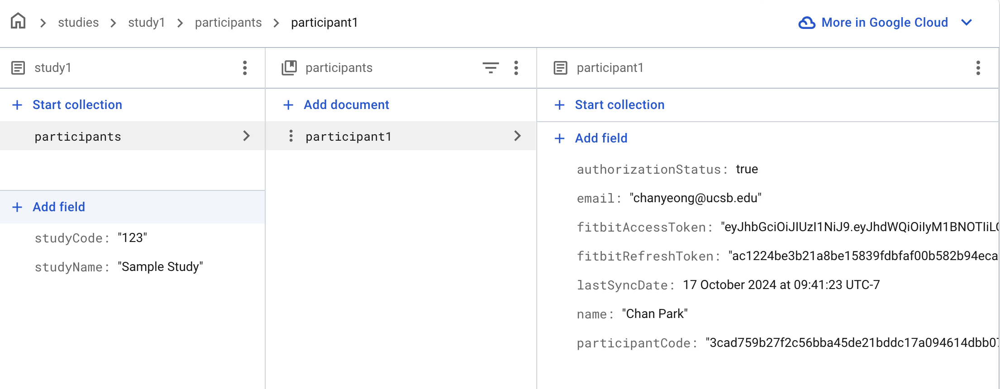

In the next section, we will walk through the process of extracting, analyzing, and visualizing data from multiple participants, simulating a **real-world** clinical trial setting. To ensure user privacy and maintain **HIPAA** compliance, all demonstrations in this notebook will use synthetic data.

## **Section 2: Multi-Person Data Extraction and Analysis Guide**

In this section, we will cover the process of extracting, analyzing, and visualizing data from multiple participants, closely simulating real-world scenarios such as clinical trials. The steps outlined here provide a systematic approach to handling participant data, from initial authentication and data extraction to advanced analysis techniques, enabling researchers to gain meaningful insights from wearable device data.

### **2.1 Import Libraries for Setup**
To begin, we need to configure the environment by importing the necessary libraries that will support data handling, visualization, and analysis throughout the notebook.

In [1]:
!pip install --no-cache-dir git+https://github.com/a-llison-lau/wearipedia

  Cloning https://github.com/a-llison-lau/wearipedia to /tmp/pip-req-build-bi65icxs
  Running command git clone --filter=blob:none --quiet https://github.com/a-llison-lau/wearipedia /tmp/pip-req-build-bi65icxs
  Resolved https://github.com/a-llison-lau/wearipedia to commit 6fe43fed00286716e69590083b0f04711ec1853a
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 266.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.5/237.5 kB 287.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 261.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.7/99.7 kB 261.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.1/51.1 kB 220.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 257.6 MB/s 

Now, we will import the remaining necessary libraries, including `matplotlib` for graph plotting, `pandas`, `numpy`, `scipy` for data processing and statistical analysis.

In [2]:
import wearipedia
import base64
import hashlib
import html
import json
import os
import re
import urllib.parse
import requests
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.covariance import EllipticEnvelope
import seaborn as sns
from scipy import stats
from scipy.ndimage import gaussian_filter
import numpy as np

### **2.2 Configuring Parameters for Data Extraction**

Next, you can specify the start date and end date of the data that you would like to extract (or simulate).

In [3]:
#@title Enter start date and end data for data extraction/simulation

START_DATE = "2024-01-01" #@param {type:"string"}
END_DATE = "2024-04-01" #@param {type:"string"}
params = {"seed": 100, "start_date": START_DATE, "end_date": END_DATE}

### **2.3 Multi-Person Data Extraction**
Now we are ready to extract data from the Fitbit device. To extract data, simply call the get_data function with the data type you would like to extract. The types of intraday data available are "intraday_breath_rate", "intraday_active_zone_minute", "intraday_activity", "heart_rate", "intraday_hrv" and "intraday_spo2". To emulate real-life scenarios in clinical studies where data from several users is analyzed simultaneously, we will add three user ids to represent three participants.

In [4]:
user_ids = ['user_1', 'user_2', 'user_3']

# Function to collect data for a single user
def collect_data_for_user(user_id, params):

    device = wearipedia.get_device("fitbit/fitbit_charge_6")

    # Collect data for each user
    data = {
        'br': device.get_data("intraday_breath_rate", params),
        'azm': device.get_data("intraday_active_zone_minute", params),
        'activity': device.get_data("minutesLightlyActive", params),
        'hr': device.get_data("intraday_heart_rate", params),
        'hrv': device.get_data("intraday_hrv", params),
        'spo2': device.get_data("intraday_spo2", params)
    }
    return data

# Dictionary to store data for all users
users_data = {}

for user_id in user_ids:
    users_data[user_id] = collect_data_for_user(user_id, params)


Let's take a look at the data that is extracted! As an example, the breathing rate (br) has the following format. Other data types also follow a similar dictionary format.

In [ ]:
for user_id in user_ids:
  print(users_data[user_id]['br'])

### **2.4 Exporting Data**
In this section, we export all of this data to JSON, which with popular scientific computing software (R, Matlab). We export each datatype separately and also export a complete version that includes all simultaneously.

In [5]:
import json
import json
import pandas as pd
import numpy as np

#@title Select which format to export data

# Set which formats you prefer to export
use_JSON = True  # @param {type:"boolean"}
use_CSV = True   # @param {type:"boolean"}
use_Excel = True # @param {type:"boolean"}

class NpEncoder(json.JSONEncoder):
    """
    Custom JSON Encoder to handle NumPy data types.
    """
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.float64) or isinstance(obj, np.float32):
            return float(obj)
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NpEncoder, self).default(obj)

# Export data for each user
for user_id in users_data:
    user_data = users_data[user_id]
    for data_type, data in user_data.items():
        # Ensure DataFrame is not empty
        if isinstance(data, list) and len(data) > 0:
            df = pd.DataFrame(data)
            # Convert DataFrame to appropriate format for JSON
            data_records = df.to_dict(orient='records')
            # Generate filenames
            json_filename = f"{user_id}_{data_type}.json"
            csv_filename = f"{user_id}_{data_type}.csv"
            excel_filename = f"{user_id}_{data_type}.xlsx"

            if use_JSON:
                with open(json_filename, 'w') as json_file:
                    json.dump(data_records, json_file, cls=NpEncoder)

            if use_CSV:
                df.to_csv(csv_filename, index=False)

            if use_Excel:
                df.to_excel(excel_filename, index=False)

### **2.5 Data Adherence for Multiple Participants**

In this section, we will simulate instances of non-adherence over extended periods, focusing specifically on heart rate data. By modeling periods of inactivity, we can better understand and visualize adherence patterns across multiple participants, which is essential for assessing data reliability and participant engagement in long-term studies.








#### **Extract Time and Heart Rate Values**

First, let's extract the time and corresponding heart rate value from our raw json format.

In [5]:
from datetime import datetime
import pandas as pd

users_hr_data = {}

for user_id, user_data in users_data.items():
    results = []

    for record in user_data['hr']:
        try:
            heart_rate_day = record.get("heart_rate_day", [])

            if heart_rate_day:
                # Extract the date from the first "activities-heart" entry
                date_str = heart_rate_day[0]["activities-heart"][0]["dateTime"]
                date_obj = datetime.strptime(date_str, "%Y-%m-%d").date()

                # Access the "activities-heart-intraday" dataset for intraday heart rate values
                dataset = heart_rate_day[0].get("activities-heart-intraday", {}).get("dataset", [])

                for entry in dataset:
                    time_str = entry["time"]
                    heart_rate_value = entry["value"]

                    # Convert time string to a time object
                    time_obj = datetime.strptime(time_str, "%H:%M:%S").time()

                    # Combine date and time into a single datetime object
                    date_time = datetime.combine(date_obj, time_obj)

                    # Append the datetime and heart rate value to results list
                    results.append([date_time, heart_rate_value])

        except KeyError as e:
            print(f"KeyError for user {user_id} on record: {record}. Missing key: {e}")

    # Create a DataFrame for this user's heart rate data and store it in the dictionary
    df = pd.DataFrame(results, columns=["datetime", "heart_rate"])
    df['datetime'] = pd.to_datetime(df['datetime'])
    users_hr_data[user_id] = df

# 'users_hr_data' now contains a DataFrame of datetime and heart rate for each user

Print the extracted dataframe with heart rate data

In [ ]:
for user_id in user_ids:
  print(users_hr_data[user_id])

                   datetime  heart_rate
0       2024-01-01 00:00:00   76.961363
1       2024-01-01 00:00:01   75.961363
2       2024-01-01 00:00:02   76.961363
3       2024-01-01 00:00:03   76.961363
4       2024-01-01 00:00:04   76.961363
...                     ...         ...
2678395 2024-01-31 23:59:55  195.000000
2678396 2024-01-31 23:59:56  195.000000
2678397 2024-01-31 23:59:57  195.000000
2678398 2024-01-31 23:59:58  195.000000
2678399 2024-01-31 23:59:59  195.000000

[2678400 rows x 2 columns]
                   datetime  heart_rate
0       2024-01-01 00:00:00   67.103244
1       2024-01-01 00:00:01   67.103244
2       2024-01-01 00:00:02   67.103244
3       2024-01-01 00:00:03   67.103244
4       2024-01-01 00:00:04   67.103244
...                     ...         ...
2678395 2024-01-31 23:59:55   50.000000
2678396 2024-01-31 23:59:56   50.000000
2678397 2024-01-31 23:59:57   50.000000
2678398 2024-01-31 23:59:58   50.000000
2678399 2024-01-31 23:59:59   50.000000

[2678400 ro

Display metadata for heart rate data

In [ ]:
hr_df = users_hr_data[user_ids[0]]
print("Heart Rate Data Metadata: \n")
print(f"Number of records: {len(hr_df)} \n")
print("Data Types:")
print(hr_df.dtypes)
print("\n Summary Statistics:")
print(hr_df.describe())
print("\n Missing Values:")
print(hr_df.isnull().sum())

Heart Rate Data Metadata: 

Number of records: 2678400 

Data Types:
datetime      datetime64[ns]
heart_rate           float64
dtype: object

 Summary Statistics:
         heart_rate
count  2.678400e+06
mean   7.816411e+01
std    4.740223e+01
min    5.000000e+01
25%    5.000000e+01
50%    5.000000e+01
75%    9.085558e+01
max    1.950000e+02

 Missing Values:
datetime      0
heart_rate    0
dtype: int64


#### **Simulate Non-Adherence**

To realistically simulate non-adherence, we will select random intervals, each spanning several hours, during which no data is recorded. Instead of randomly marking individual entries as `None`, this approach mirrors actual behavior, where users are unlikely to remove and replace the device within seconds.

We'll simulate non-adherence by randomly selecting dates and creating random intervals during which no data is recorded for each user. We will use 30% as the threshold value to select the dates among all dates in the dataframe in which non-adherence occurs.

You can choose to simulate non-adherence periods in your data. This is useful when working with synthetic data to model real-world scenarios where participants may not consistently wear their devices.

**Note:** When using real data, you may want to skip this step.


Non-adherence simulation applied for user user_1.
Non-adherence simulation applied for user user_2.
Non-adherence simulation applied for user user_3.


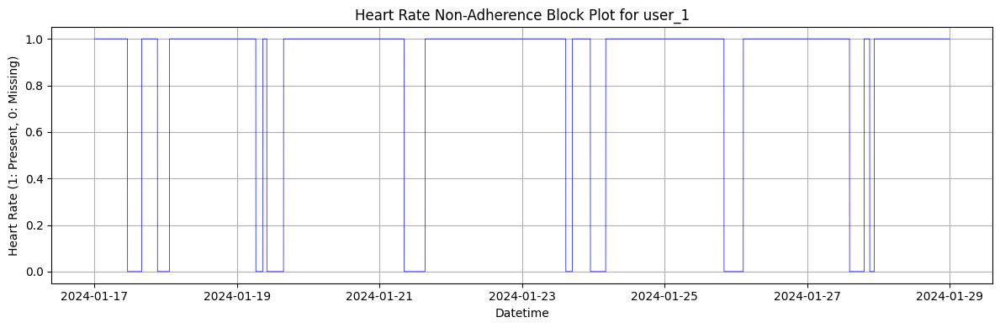

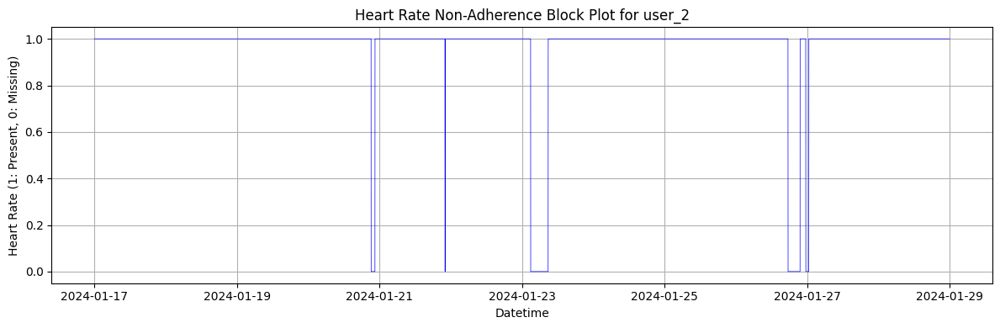

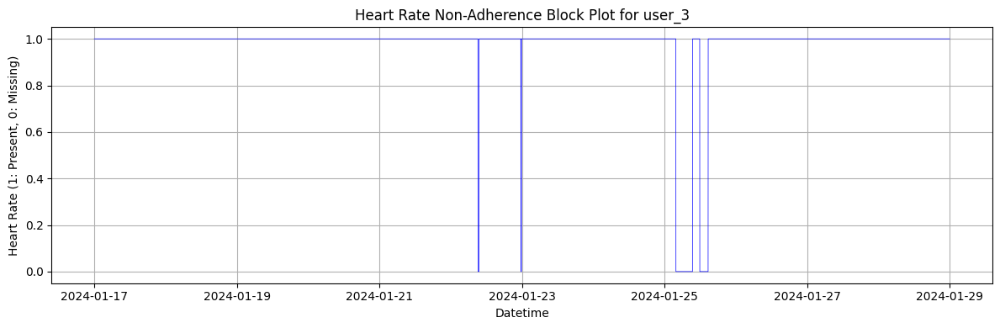

In [ ]:
from datetime import datetime
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# Assuming 'users_hr_data' is already populated with heart rate data for each user

# Step 1: Introduce the Toggle
#@title Simulate Non-Adherence
simulate_non_adherence = True  #@param {type:"boolean"}

# Dictionary to store DataFrames after (optional) non-adherence simulation
users_non_adherence_df = {}

# Function to create random intervals
def create_random_intervals(date):
    intervals = []
    num_intervals = random.choice([1, 2])
    for _ in range(num_intervals):
        start_hour = random.randint(0, 23)
        start_minute = random.randint(0, 59)
        start_second = random.randint(0, 59)
        start_time = pd.Timestamp(date) + pd.Timedelta(hours=start_hour, minutes=start_minute, seconds=start_second)
        duration_hours = random.randint(0, 5)
        duration_minutes = random.randint(0, 59)
        duration_seconds = random.randint(0, 59)
        end_time = start_time + pd.Timedelta(hours=duration_hours, minutes=duration_minutes, seconds=duration_seconds)
        intervals.append((start_time, end_time))
    return intervals

# Step 2: Conditional Non-Adherence Simulation
for user_id in users_hr_data:
    df = users_hr_data[user_id]

    if simulate_non_adherence:
        # Seed for reproducibility, unique per user
        seed_value = hash(user_id) % (2**32)
        np.random.seed(seed_value)
        random.seed(seed_value)

        unique_dates = df['datetime'].dt.date.unique()

        # Select 30% of dates to simulate non-adherence
        selected_dates = np.random.choice(unique_dates, size=int(len(unique_dates) * 0.3), replace=False)

        # Create intervals to nullify
        non_adherence_df = df.copy()
        for date in selected_dates:
            intervals = create_random_intervals(date)
            for start_time, end_time in intervals:
                mask = (non_adherence_df['datetime'] >= start_time) & (non_adherence_df['datetime'] <= end_time)
                non_adherence_df.loc[mask, 'heart_rate'] = None  # Set heart_rate to None for non-adherence intervals

        # Reset index after nullification
        non_adherence_df.reset_index(drop=True, inplace=True)
        users_non_adherence_df[user_id] = non_adherence_df

        print(f"Non-adherence simulation applied for user {user_id}.")
    else:
        # If not simulating non-adherence, use the original data
        users_non_adherence_df[user_id] = df.copy()
        print(f"Non-adherence simulation skipped for user {user_id}.")

# Reindexing to fill missing timestamps
for user_id in users_non_adherence_df:
    df = users_non_adherence_df[user_id]

    # Define the complete date range for the user
    start_datetime = df['datetime'].min().floor('D')
    end_datetime = df['datetime'].max().ceil('D')
    date_range = pd.date_range(start=start_datetime, end=end_datetime, freq='S')

    # Reindex the DataFrame to include all timestamps
    df = df.set_index('datetime').reindex(date_range).reset_index()
    df.rename(columns={'index': 'datetime'}, inplace=True)

    # Keep None for missing heart_rate values to simulate non-adherence
    df['heart_rate'] = df['heart_rate'].apply(lambda x: None if pd.isna(x) else x)

    users_non_adherence_df[user_id] = df

VISUAL_START_DATE = "2024-01-17"
VISUAL_END_DATE = "2024-01-29"
visual_start_date = pd.to_datetime(VISUAL_START_DATE)
visual_end_date = pd.to_datetime(VISUAL_END_DATE)

for user_id in users_non_adherence_df:
    df = users_non_adherence_df[user_id]

    # Select data within the visualization range
    selected_rows = df[(df['datetime'] >= visual_start_date) & (df['datetime'] <= visual_end_date)]

    selected_rows_copy = selected_rows.copy()
    # Replace heart_rate values: 1 if not NaN, else 0
    selected_rows_copy['heart_rate'] = selected_rows_copy['heart_rate'].apply(lambda x: 1 if not pd.isna(x) else 0)

    # Plot the block plot
    plt.figure(figsize=(12, 4))
    plt.plot(selected_rows_copy['datetime'], selected_rows_copy['heart_rate'], linewidth=0.5, color='blue')
    plt.title(f'Heart Rate Non-Adherence Block Plot for {user_id}')
    plt.xlabel('Datetime')
    plt.ylabel('Heart Rate (1: Present, 0: Missing)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### **2.6 Data Visualization**

In this section, we'll plot a block plot for each user to visualize when data was recorded (adherence) and when it was not (non-adherence). We will be visualizing our three kinds of data in a simple, customizable plot. This plot is intended to provide a starter example for plotting, whereas later examples emphasize deep control and aesthetics.

Similar to the previous section, we would first have to reorganize our raw JSON format data. We'll process the data for each user separately, extracting the necessary information and organizing it into DataFrames.

We will plot graphs to visualize the following data:
- **Heart rate** (per second)
- **Heart rate variability (hrv)** in terms of **Root Mean Square of Successive Differences (RMSSD)**
- **Heart rate variability (hrv)** in terms of the power in interbeat interval fluctuations within the **low frequency (lf)** band and **high frequency (hf)** band ([see description from Fitbit web api](https://dev.fitbit.com/build/reference/web-api/intraday/get-hrv-intraday-by-date/))
- **SPO2 (per minute during sleep)**
- **Average breathing rate** during each sleep stage (per sleep).

#### **Heart Rate Data Processing**

In [6]:
from datetime import datetime
import pandas as pd

# Dictionary to store processed heart rate data for all users
users_hr_df = {}

# Loop through each user and process heart rate data
for user_id, user_data in users_data.items():
    # Initialize an empty list to store heart rate records
    results = []

    # Iterate over each record in the user's heart rate data
    for record in user_data['hr']:
        try:
            # Access the 'heart_rate_day' data
            heart_rate_day = record.get("heart_rate_day", [])

            if heart_rate_day:
                # Extract the date from 'activities-heart'
                date_str = heart_rate_day[0]["activities-heart"][0]["dateTime"]
                date_obj = datetime.strptime(date_str, "%Y-%m-%d").date()

                # Access intraday heart rate dataset
                dataset = heart_rate_day[0].get("activities-heart-intraday", {}).get("dataset", [])

                # Loop through each heart rate entry
                for entry in dataset:
                    time_str = entry["time"]  # Time string (e.g., '12:34:56')
                    heart_rate_value = entry["value"]  # Heart rate value

                    # Convert time string to time object
                    time_obj = datetime.strptime(time_str, "%H:%M:%S").time()

                    # Combine date and time into datetime object
                    date_time = datetime.combine(date_obj, time_obj)

                    # Append the datetime and heart rate value to results list
                    results.append([date_time, heart_rate_value])

        except KeyError as e:
            print(f"KeyError for user {user_id} on record: {record}. Missing key: {e}")

    # Create a DataFrame from the results list
    df = pd.DataFrame(results, columns=["datetime", "heart_rate"])

    # Ensure 'datetime' is in datetime format
    df['datetime'] = pd.to_datetime(df['datetime'])

    # Store the DataFrame in the dictionary with the user ID as the key
    users_hr_df[user_id] = df


#### **Breathing Rate Data Processing**

In [23]:
# Dictionary to store breathing rate data for all users
users_br_df = {}

# Loop through each user and process breathing rate data
for user_id, user_data in users_data.items():
    br = user_data['br']  # Breathing rate data
    extracted_data = []

    # Extract breathing rate summaries for each sleep stage
    for entry in br:
        for br_entry in entry['br']:
            row = {
                'datetime': br_entry['dateTime'],
                'deepSleepSummary': br_entry['value']['deepSleepSummary']['breathingRate'],
                'remSleepSummary': br_entry['value']['remSleepSummary']['breathingRate'],
                'lightSleepSummary': br_entry['value']['lightSleepSummary']['breathingRate'],
                'fullSleepSummary': br_entry['value']['fullSleepSummary']['breathingRate']
            }
            extracted_data.append(row)

    # Create a DataFrame from the extracted data
    br_df = pd.DataFrame(extracted_data)

    # Convert 'datetime' to datetime format
    br_df['datetime'] = pd.to_datetime(br_df['datetime'])

    # Store the DataFrame in the dictionary
    users_br_df[user_id] = br_df


In [25]:
for user_id in user_ids:
  print(users_br_df[user_id])

     datetime  deepSleepSummary  remSleepSummary  lightSleepSummary  \
0  2024-01-01         12.484795        17.286336          16.609053   
1  2024-01-02         15.829268        16.170028          15.531919   
2  2024-01-03         13.391906        13.979346          15.642975   
3  2024-01-04         12.912303        14.640428          17.750795   
4  2024-01-05         13.859969        16.104277          18.240617   
5  2024-01-06          9.461627        16.881619          18.009894   
6  2024-01-07         11.336724        14.485818          17.002636   
7  2024-01-08         12.265907        16.742269          17.109492   
8  2024-01-09         15.097335        13.305228          16.329846   
9  2024-01-10         11.679915        15.985727          15.805410   
10 2024-01-11          8.997997        15.520492          19.372708   
11 2024-01-12         12.713291        16.002522          16.191505   
12 2024-01-13         12.349333        16.575593          16.890690   
13 202

#### **HRV Data Processing (RMSSD, LF, HF)**

In [7]:
# Dictionaries to store HRV data for all users
users_rmssd_df = {}  # For RMSSD values
users_lf_hf_df = {}  # For LF and HF values

# Loop through each user and process HRV data
for user_id, user_data in users_data.items():
    hrv = user_data['hrv']  # HRV data
    rmssd_data = []  # List to store RMSSD data
    lf_hf_data = []  # List to store LF and HF data

    # Extract HRV measurements
    for entry in hrv:
        for hrv_entry in entry['hrv']:
            for minute_entry in hrv_entry['minutes']:
                # Extract RMSSD value
                rmssd_data.append({
                    'minute': minute_entry['minute'],
                    'rmssd': minute_entry['value']['rmssd']
                })

                # Extract LF and HF values
                lf_hf_data.append({
                    'minute': minute_entry['minute'],
                    'lf': minute_entry['value']['lf'],
                    'hf': minute_entry['value']['hf']
                })

    # Create DataFrames for RMSSD and LF/HF data
    rmssd_df = pd.DataFrame(rmssd_data)
    rmssd_df['minute'] = pd.to_datetime(rmssd_df['minute'])
    users_rmssd_df[user_id] = rmssd_df

    lf_hf_df = pd.DataFrame(lf_hf_data)
    lf_hf_df['minute'] = pd.to_datetime(lf_hf_df['minute'])
    users_lf_hf_df[user_id] = lf_hf_df


#### **SpO₂ Data Processing**



In [8]:
# Dictionary to store SpO₂ data for all users
users_spo2_df = {}

# Loop through each user and process SpO₂ data
for user_id, user_data in users_data.items():
    spo2 = user_data['spo2']  # SpO₂ data
    minute_value_data = []

    # Extract SpO₂ values for each minute
    for entry in spo2:
        for minute_entry in entry['minutes']:
            minute_value_data.append({
                'minute': minute_entry['minute'],
                'value': minute_entry['value']
            })

    # Create a DataFrame from the minute value data
    spo2_df = pd.DataFrame(minute_value_data)

    # Convert 'minute' to datetime format
    spo2_df['minute'] = pd.to_datetime(spo2_df['minute'])

    # Store the DataFrame in the dictionary
    users_spo2_df[user_id] = spo2_df


Here, you will specify the visualization start date and end date. and select the data you want to plot

In [ ]:
# Visualization date range
VISUALIZATION_START_DATE = "2024-01-01"  # Adjust as needed
VISUALIZATION_END_DATE = "2024-02-17"    # Adjust as needed

visualization_start_date = pd.to_datetime(VISUALIZATION_START_DATE)
visualization_end_date = pd.to_datetime(VISUALIZATION_END_DATE)

# Select the data to plot
feature = "breathing rate"  #@param ["heart rate", "breathing rate", "hrv (rmssd)", "hrv (lf and hf)", "spo2"]

In [ ]:
import matplotlib.pyplot as plt

def plot_feature(users_data_dict, feature_name, start_date, end_date):
    """
    Plots the selected feature for multiple users on the same graph.

    Parameters:
    - users_data_dict: Dictionary containing DataFrames of the feature for each user.
    - feature_name: String indicating the feature to plot.
    - start_date: Start date for visualization (datetime object).
    - end_date: End date for visualization (datetime object).
    """
    plt.figure(figsize=(15, 6))
    plt.grid(True)

    # Loop through each user and plot their data
    for user_id, df in users_data_dict.items():
        if feature_name == "heart rate":
            # Filter data within the date range
            selected_df = df[(df['datetime'] >= start_date) & (df['datetime'] < end_date)]
            # Plot heart rate data
            plt.scatter(selected_df['datetime'], selected_df['heart_rate'], s=0.1, alpha=0.7, label=user_id)
            plt.ylabel('Heart Rate (bpm)')
            plt.ylim(40, 200)

        elif feature_name == "breathing rate":
            # Filter data within the date range
            selected_df = df[(df['datetime'] >= start_date) & (df['datetime'] < end_date)]
            # Plot breathing rate data for each sleep stage
            for column in selected_df.columns[1:]:
                plt.plot(selected_df['datetime'], selected_df[column], label=f"{user_id} - {column}")
            plt.ylabel('Breathing Rate (breaths/min)')
            plt.ylim(0, 25)

        elif feature_name == "hrv (rmssd)":
            # Filter data within the date range
            selected_df = df[(df['minute'] >= start_date) & (df['minute'] < end_date)]
            # Plot RMSSD data
            plt.scatter(selected_df['minute'], selected_df['rmssd'], s=0.5, label=user_id)
            plt.ylabel('RMSSD')
            plt.ylim(0, 100)

        elif feature_name == "hrv (lf and hf)":
            # Filter data within the date range
            selected_df = df[(df['minute'] >= start_date) & (df['minute'] < end_date)]
            # Plot LF and HF data
            for band in ["lf", "hf"]:
                color = 'red' if band == 'hf' else 'green'
                plt.scatter(selected_df['minute'], selected_df[band], color=color, s=0.5, label=f"{user_id} - {band}")
            plt.ylabel('Power (ms²)')
            plt.ylim(0, 1200)

        elif feature_name == "spo2":
            # Filter data within the date range
            selected_df = df[(df['minute'] >= start_date) & (df['minute'] < end_date)]
            # Plot SpO₂ data
            plt.scatter(selected_df['minute'], selected_df['value'], s=0.1, label=user_id)
            plt.ylabel('SpO₂ (%)')
            plt.ylim(90, 100)

        else:
            print("Selected feature is not recognized.")
            return

    # Common plot configurations
    plt.title(f'{feature_name.capitalize()} Over Time')
    plt.xlabel('Datetime')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Plot the selected feature

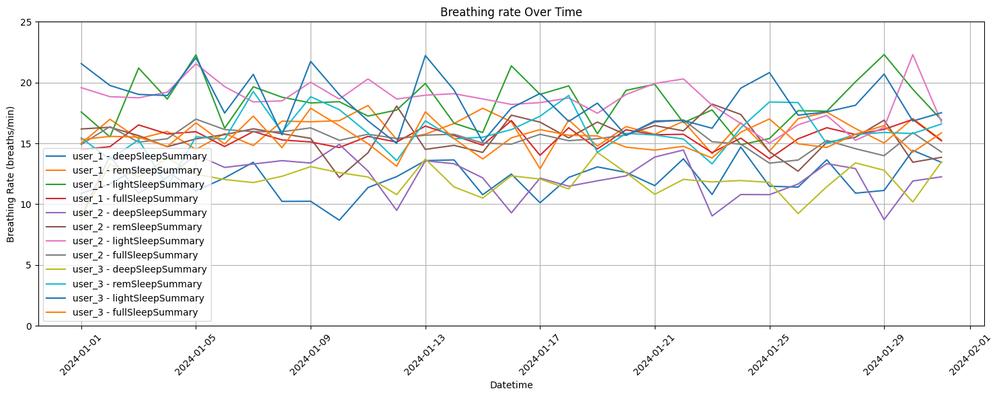

In [ ]:
# Determine which users_data_dict to use based on the selected feature
if feature == "heart rate":
    users_data_dict = users_hr_df
elif feature == "breathing rate":
    users_data_dict = users_br_df
elif feature == "hrv (rmssd)":
    users_data_dict = users_rmssd_df
elif feature == "hrv (lf and hf)":
    users_data_dict = users_lf_hf_df
elif feature == "spo2":
    users_data_dict = users_spo2_df
else:
    print("Selected feature is not recognized.")
    users_data_dict = None

# If the feature is recognized, plot it
if users_data_dict is not None:
    plot_feature(users_data_dict, feature, visualization_start_date, visualization_end_date)


### **2.7 Advanced Data Visualization for Multiple Participants**
In this section, we will explore advanced data visualization techniques by replicating specific plots from the Fitbit app. This process involves manual customization, such as adjusting text positioning, color schemes, and other stylistic elements to closely match the original Fitbit visualizations.

#### **Heart Rate Throughout the Day**
Here, we will recreate a plot that displays heart rate versus time of day, inspired by the Fitbit app. This plot highlights heart rate zones associated with various time intervals, providing insights into daily patterns, such as peaks during exercise, declines during sleep, or fluctuations in response to stress or activity. This visualization offers a comprehensive view of heart rate variability over the course of a day.

<img src="https://imgur.com/Goz1UD2.png" width="300">

### **Step 1: Aggregate Heart Rate Data**
We'll calculate the average heart rate for each participant at 30-minute intervals throughout the specified day.

In [9]:
import pandas as pd
from datetime import timedelta

# Specify the day for visualization
DAY = "2024-01-19"  # Adjust as needed
vis_day = pd.to_datetime(DAY)
vis_end_day = vis_day + timedelta(days=1)

# Create a list to store aggregated data for all users
aggregated_data_list = []

for user_id, hr_df in users_hr_df.items():
    # Filter data for the specified day
    DAY_hr_df = hr_df[(hr_df['datetime'] >= vis_day) & (hr_df['datetime'] < vis_end_day)].copy()
    DAY_hr_df['datetime'] = pd.to_datetime(DAY_hr_df['datetime'])

    if DAY_hr_df.empty:
        print(f"No heart rate data available for {user_id} on {DAY}.")
        continue

    # Set 'datetime' as the index
    DAY_hr_df.set_index('datetime', inplace=True)

    # Resample data to 30-minute intervals and calculate the mean heart rate
    resampled_hr_df = DAY_hr_df.resample('30T').mean().reset_index()

    # Add user ID to the DataFrame
    resampled_hr_df['user_id'] = user_id

    # Append to the list
    aggregated_data_list.append(resampled_hr_df)


## **Step 2: Combine Data from All Participants**
We will combine the aggregated data into a single DataFrame.

In [9]:
# Combine all aggregated data into a single DataFrame
combined_hr_df = pd.concat(aggregated_data_list)

# Ensure 'datetime' is in datetime format
combined_hr_df['datetime'] = pd.to_datetime(combined_hr_df['datetime'])

# Drop rows with missing heart rate values
combined_hr_df.dropna(subset=['heart_rate'], inplace=True)


### **Creating an Interactive Plot**
We utilize `Plotly Express` to create an interactive line plot that displays heart rate data for all participants.

In [10]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go

# Assuming 'combined_hr_df' has been prepared with aggregated data

# Define heart rate zones
def get_hr_zone(hr_value):
    if hr_value <= 110:
        return 'Below Zones'
    elif 110 < hr_value <= 136:
        return 'Fat Burn'
    elif 136 < hr_value <= 169:
        return 'Cardio'
    else:
        return 'Peak'

# Classify heart rate values into zones
combined_hr_df['hr_zone'] = combined_hr_df['heart_rate'].apply(get_hr_zone)

# Define the x-axis tick positions and labels
tick_times = [
    vis_day + pd.Timedelta(hours=0),
    vis_day + pd.Timedelta(hours=6),
    vis_day + pd.Timedelta(hours=12),
    vis_day + pd.Timedelta(hours=18),
    vis_day + pd.Timedelta(hours=24)
]
tick_labels = ['12AM', '6AM', '12PM', '6PM', '12AM']

# Choose a custom color sequence for participants
custom_color_sequence = px.colors.qualitative.Vivid

# Create the interactive plot
fig = px.line(
    combined_hr_df,
    x='datetime',
    y='heart_rate',
    color='user_id',
    title='Average Heart Rate Throughout the Day Across Participants',
    labels={
        'datetime': 'Time of Day',
        'heart_rate': 'Average Heart Rate (bpm)',
        'user_id': 'Participant'
    },
    hover_data={'user_id': True, 'heart_rate': True},
    color_discrete_sequence=custom_color_sequence
)

# Add shaded regions for heart rate zones
fig.update_layout(
    shapes=[
        # Below Zones
        dict(
            type='rect',
            xref='paper',
            yref='y',
            x0=0, x1=1,
            y0=0, y1=110,
            fillcolor='#4DC3C3',
            opacity=0.1,
            layer='below',
            line_width=0,
        ),
        # Fat Burn
        dict(
            type='rect',
            xref='paper',
            yref='y',
            x0=0, x1=1,
            y0=110, y1=136,
            fillcolor='yellow',
            opacity=0.1,
            layer='below',
            line_width=0,
        ),
        # Cardio
        dict(
            type='rect',
            xref='paper',
            yref='y',
            x0=0, x1=1,
            y0=136, y1=169,
            fillcolor='orange',
            opacity=0.1,
            layer='below',
            line_width=0,
        ),
        # Peak
        dict(
            type='rect',
            xref='paper',
            yref='y',
            x0=0, x1=1,
            y0=169, y1=200,  # Adjust y1 as needed
            fillcolor='red',
            opacity=0.1,
            layer='below',
            line_width=0,
        ),
    ]
)

# Add invisible traces for heart rate zones to include them in the legend
zone_legend_traces = []

zone_colors = {
    'Below Zones': '#4DC3C3',
    'Fat Burn': 'yellow',
    'Cardio': 'orange',
    'Peak': 'red'
}

for zone_name, color in zone_colors.items():
    zone_legend_traces.append(
        go.Scatter(
            x=[None],
            y=[None],
            mode='markers',
            marker=dict(size=10, color=color),
            legendgroup='Heart Rate Zones',
            showlegend=True,
            name=zone_name
        )
    )

# Add the zone legend traces to the figure
for trace in zone_legend_traces:
    fig.add_trace(trace)

# Update layout with custom x-axis ticks and improved aesthetics
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    margin=dict(l=60, r=60, t=80, b=60),
    plot_bgcolor='#ffffff',
    paper_bgcolor='#f8f9fa',
    font=dict(family='Helvetica, Arial, sans-serif', size=12, color='#343a40'),
    title_font=dict(size=20, color='#343a40', family='Helvetica, Arial, sans-serif'),
    legend_title_font=dict(size=14, color='#343a40'),
    xaxis_title_font=dict(size=16, color='#343a40'),
    yaxis_title_font=dict(size=16, color='#343a40'),
    xaxis=dict(
        tickmode='array',
        tickvals=tick_times,
        ticktext=tick_labels,
        range=[vis_day, vis_end_day],
        title_text='Time of Day'
    ),
    yaxis=dict(
        title_text='Average Heart Rate (bpm)'
    ),
    legend=dict(
        itemsizing='constant',
        orientation='v',
        traceorder='normal',
        x=1.02,
        y=1,
        bgcolor='rgba(255,255,255,0.5)',
        bordercolor='Black',
        borderwidth=1
    )
)

# Add annotations for peak and minimum heart rates
for user_id in combined_hr_df['user_id'].unique():
    user_data = combined_hr_df[combined_hr_df['user_id'] == user_id]
    # Find peak heart rate
    max_hr = user_data['heart_rate'].max()
    max_time = user_data[user_data['heart_rate'] == max_hr]['datetime'].iloc[0]
    # Find minimum heart rate
    min_hr = user_data['heart_rate'].min()
    min_time = user_data[user_data['heart_rate'] == min_hr]['datetime'].iloc[0]
    # Get the color assigned to this user
    color = fig.data[combined_hr_df['user_id'].unique().tolist().index(user_id)].line.color
    # Add annotation for peak heart rate
    fig.add_annotation(
        x=max_time,
        y=max_hr,
        text=f"Peak HR ({user_id}): {max_hr:.1f} bpm",
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=-30,
        font=dict(color=color),
        arrowcolor=color
    )
    # Add annotation for minimum heart rate
    fig.add_annotation(
        x=min_time,
        y=min_hr,
        text=f"Min HR ({user_id}): {min_hr:.1f} bpm",
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=30,
        font=dict(color=color),
        arrowcolor=color
    )

# Show the interactive plot
fig.show()


# 2.8. Outlier Detection with Advanced Statistics

Before diving into advanced analyses, it's crucial for researchers to perform an initial examination of their data to ensure its quality and integrity. This preliminary step helps identify any anomalies, inconsistencies, or errors that could impact the validity of subsequent analyses. The following are key steps researchers should take when they initially receive their data:

**1: Data Cleaning:**

*    **Check for Missing Values**: Identify and handle any missing or null entries appropriately.

*    **Remove Duplicates**: Ensure there are no duplicate records that could skew the results.

*    **Validate Data Types**: Confirm that all variables have the correct data types (e.g., numeric, datetime).

**2: Data Validation**:

*    **Assess Data Ranges:** Verify that all measurements fall within plausible physiological or logical ranges (e.g., heart rates between 30 and 200 bpm).

*    **Consistency Checks:** Look for inconsistencies such as negative values where they shouldn't exist or timestamps that don't make sense.

**3: Exploratory Data Analysis (EDA)**:

*    **Descriptive Statistics:** Calculate mean, median, standard deviation, and other relevant statistics for each variable to understand their distributions.

*    **Visualization:** Create histograms, box plots, and time series plots to visually inspect for outliers or unusual patterns.

**4: Initial Outlier Detection:**

*    **Univariate Analysis:** Use statistical methods like Z-scores or box plots to identify outliers in individual variables.

*    **Multivariate Analysis:** Apply techniques such as **Mahalanobis distance** or **Isolation Forest** to detect anomalies considering multiple variables simultaneously.

By conducting this initial data analysis, researchers can detect and address potential issues early on, ensuring that their dataset is clean and reliable. This foundational step is essential for producing valid and credible research findings and should be performed before any advanced analyses.

#### **Inject some anomalies in Data**

Since our synthetic data resembles a healthy adult’s heart rate, we will inject some anomalies to realistically simulate unusual patterns or errors in the data.

In [12]:
from datetime import timedelta
import numpy as np

# Specify the date for visualization and analysis
VIS_START_DATE = "2024-01-10"  # Adjust as needed
vis_start_date = pd.to_datetime(VIS_START_DATE)
vis_end_date = vis_start_date + timedelta(days=1)

# Dictionary to store anomaly-injected single-day data for each user
users_hr_anomaly_single_day_df = {}

for user_id, hr_df in users_hr_df.items():
    # Ensure 'datetime' is in datetime format
    hr_df['datetime'] = pd.to_datetime(hr_df['datetime'])

    # Filter data for the specified day, including the entire day
    day_hr_df = hr_df[(hr_df['datetime'] >= vis_start_date) & (hr_df['datetime'] < vis_end_date)].reset_index(drop=True)

    if day_hr_df.empty:
        print(f"No heart rate data available for {user_id} on {VIS_START_DATE}.")
        continue

    # Inject anomalies
    sample_size = max(1, int(len(day_hr_df) * 0.00005))
    sampled_rows = day_hr_df.sample(n=sample_size)

    # Define anomalous heart rate values
    anomalous_values = [200, 30]
    sampled_rows['heart_rate'] = np.random.choice(anomalous_values, size=sample_size)

    # Update the heart rate values in the DataFrame
    day_hr_df.loc[sampled_rows.index, 'heart_rate'] = sampled_rows['heart_rate']

    # Store the DataFrame with anomalies
    users_hr_anomaly_single_day_df[user_id] = day_hr_df


### **2.8.1 Individual-Level Anomaly Detection**

For individual-level outlier detection, we are going to use the following methods:

Unconditional Outlier Detection, $P(\text{BPM})$, examines each BPM measurement independently. It aims to identify data points that deviate substantially from the overall BPM distribution, without considering time sequence.
### Unconditional Outlier Detection:

#### Standard Deviation Method:

- Assumes BPM values follow a normal distribution.
- Marks values beyond a specified number of standard deviations from the mean as outliers, often with a cutoff between 1 and 4 standard deviations.

#### Interquartile Range (IQR) Method:
- Doesn't assume normal data distribution.
- Computes IQR between the 25th and 75th percentiles.
- Considers data points below $\text{Q1} - 1.5\times\text{IQR}$ or above $\text{Q3} + 1.5\times\text{IQR}$ as outliers.

### Conditional Outlier Detection, $P(\text{BPM}_{t}\mid\text{BPM}_{t-1})$

This approach considers the sequential nature of BPM data, evaluating each reading in relation to its predecessor to detect sudden, unexpected changes over short intervals.

Methods for Conditional Outlier Detection:

#### Change Detection:
- Calculates the difference between consecutive BPM readings.
- Identifies significant deviations from the expected fluctuation range as outliers.

#### Time Series Analysis:
- Advanced methods like ARIMA model BPM time series to predict future values.
- Identifies outliers as readings significantly different from the model's predictions.

### Assumptions and Calculations

The choice of outlier detection method depends on assumptions about data distribution. For BPM data, conditional methods can provide more context by accounting for changes over time, which may highlight sudden physiological changes or sensor errors.

To implement conditional outlier detection, we calculate the change between successive BPM readings:

$\Delta \text{BPM}_t = \text{BPM}_t - \text{BPM}_{t-1}$

We then set a threshold based on the mean and standard deviation of these changes:

$Threshold = Mean(\Delta \text{BPM}) \pm k \times StdDev(\Delta \text{BPM})$,

where $k$ represents the number of standard deviations to consider.

Given the high-frequency nature of our heart rate data, we will use conditional outlier detection.

Since we have high frequency heart rate data, we will use conditional outlier detection.

#### **Step 1: Establish a Statistical Threshold**

The threshold is calculated by multiplying the standard deviation of the BPM differences by a factor. This factor is chosen to capture the most extreme variations, which are less probable to occur naturally.

In [ ]:
users_thresholds = {}

for user_id, hr_diff_df in users_hr_anomaly_single_day_df.items():
    mean_diff = hr_diff_df["hr_diff"].mean()
    std_diff = hr_diff_df["hr_diff"].std()

    # Set a threshold for detecting outliers (e.g., 4 standard deviations)
    threshold = 4 * std_diff

    users_thresholds[user_id] = threshold

#### **Step 2: Identify Conditional Outliers**

This step filters the data to find instances where the absolute value of the HRV difference exceeds our threshold, suggesting an unusual and abrupt change in BPM.

In [ ]:
users_conditional_outliers = {}

for user_id, hr_diff_df in users_hr_anomaly_single_day_df.items():
    threshold = users_thresholds[user_id]

    # Identify where the absolute difference exceeds the threshold
    conditional_outliers = hr_diff_df[abs(hr_diff_df['hr_diff']) > threshold]

    users_conditional_outliers[user_id] = conditional_outliers

#### **Step 3: Visualize Outliers**

Visualization is crucial as it provides an immediate sense of where outliers occur in the dataset, offering insights into their potential causes and implications.

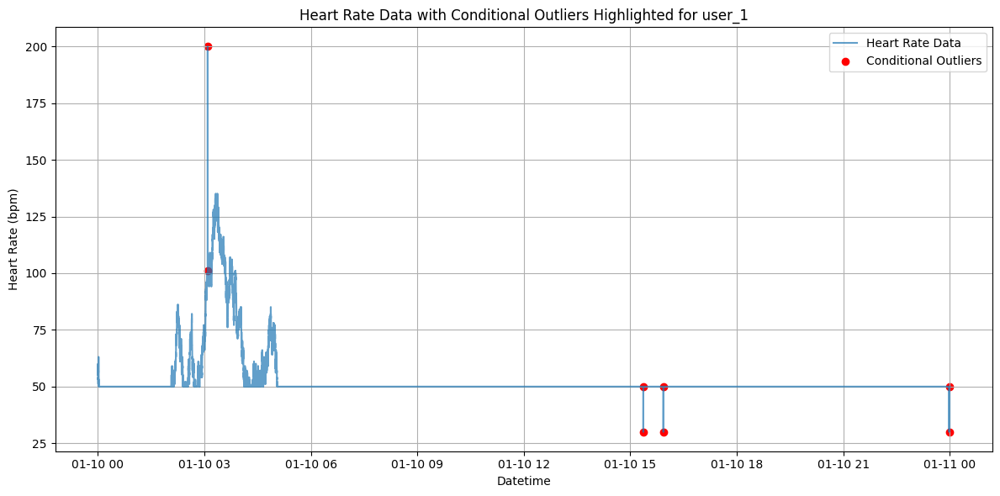

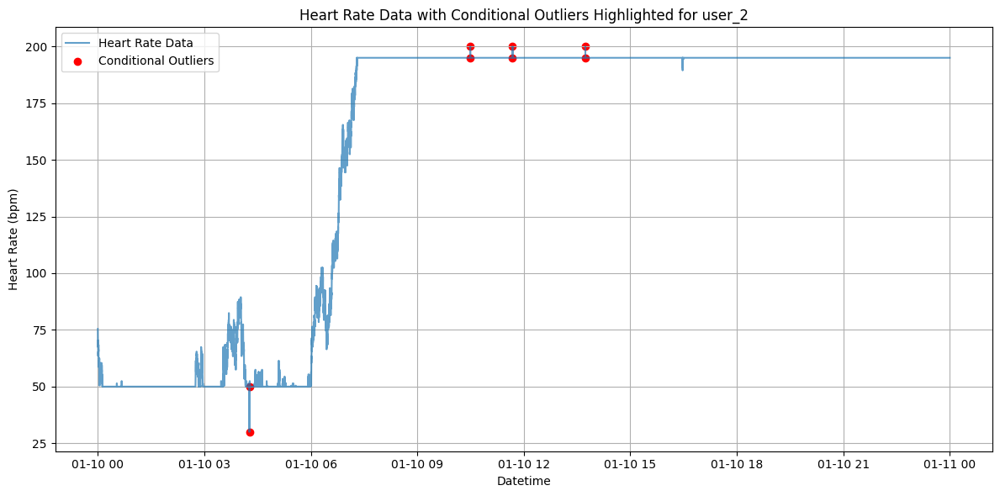

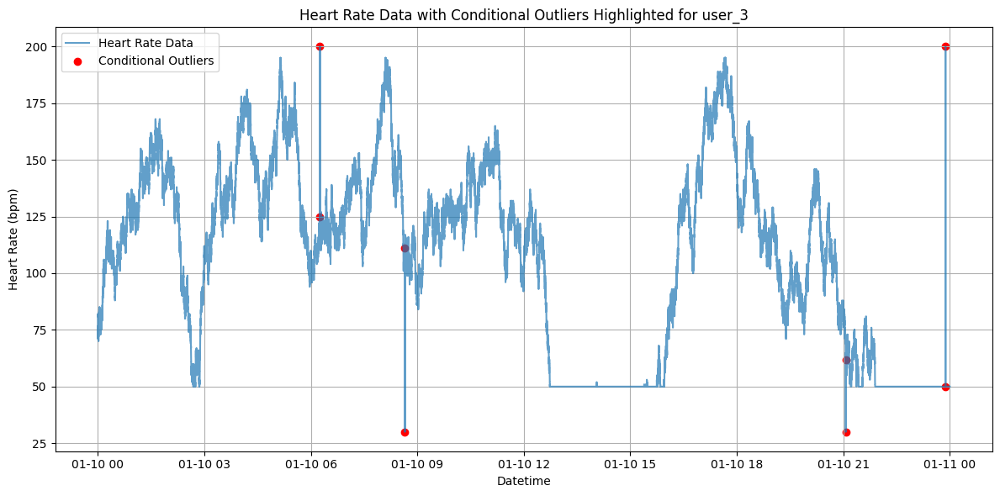

In [ ]:
import matplotlib.pyplot as plt

for user_id, hr_diff_df in users_hr_anomaly_single_day_df.items():
    conditional_outliers = users_conditional_outliers[user_id]

    # Plot heart rate data with conditional outliers highlighted
    plt.figure(figsize=(12, 6))
    plt.plot(hr_diff_df['datetime'], hr_diff_df['heart_rate'], label='Heart Rate Data', alpha=0.7)
    plt.scatter(conditional_outliers['datetime'], conditional_outliers['heart_rate'], color='r', label='Conditional Outliers')
    plt.legend()
    plt.title(f'Heart Rate Data with Conditional Outliers Highlighted for {user_id}')
    plt.xlabel('Datetime')
    plt.ylabel('Heart Rate (bpm)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### **2.8.2. Population-Level Outlier Detection**
We will apply an outlier detection method across all participants to identify unusual heart rate values. We'll use the Isolation Forest algorithm, which is effective for detecting anomalies in datasets with minimal assumptions about the data distribution.

**Isolation Forest:**

*   An unsupervised learning algorithm effective for anomaly detection.
*   It works by randomly partitioning data and isolating observations that are 'few and different'.

In [13]:
import pandas as pd

# List to store heart rate data from all users with anomalies
hr_anomaly_single_day_list = []

for user_id, hr_df in users_hr_anomaly_single_day_df.items():
    user_hr_data = hr_df[['datetime', 'heart_rate']].copy()
    user_hr_data['user_id'] = user_id  # Add user ID for identification
    hr_anomaly_single_day_list.append(user_hr_data)

# Combine all heart rate data into one DataFrame
combined_hr_anomaly_single_day_df = pd.concat(hr_anomaly_single_day_list, ignore_index=True)

# Ensure 'datetime' is in datetime format
combined_hr_anomaly_single_day_df['datetime'] = pd.to_datetime(combined_hr_anomaly_single_day_df['datetime'])

# Drop any rows with missing heart rate values
combined_hr_anomaly_single_day_df.dropna(subset=['heart_rate'], inplace=True)


**Model Parameters:**
*   `contamination=0.01`: Assumes that 1% of the data are anomalies.

*   `random_state=42`: Ensures reproducibility.

**Anomaly Prediction:**
Assigns an anomaly_score of `-1` for anomalies and `1` for normal data.

In [14]:
from sklearn.ensemble import IsolationForest

# Prepare data for modeling
X = combined_hr_anomaly_single_day_df[['heart_rate']].values

# Fit the Isolation Forest model
iso_forest = IsolationForest(contamination=0.01, random_state=42)
iso_forest.fit(X)

# Predict anomalies
combined_hr_anomaly_single_day_df['anomaly_score'] = iso_forest.predict(X)

# Identify outliers
outliers = combined_hr_anomaly_single_day_df[combined_hr_anomaly_single_day_df['anomaly_score'] == -1]
normal_data = combined_hr_anomaly_single_day_df[combined_hr_anomaly_single_day_df['anomaly_score'] != -1]


Visualize the outliers

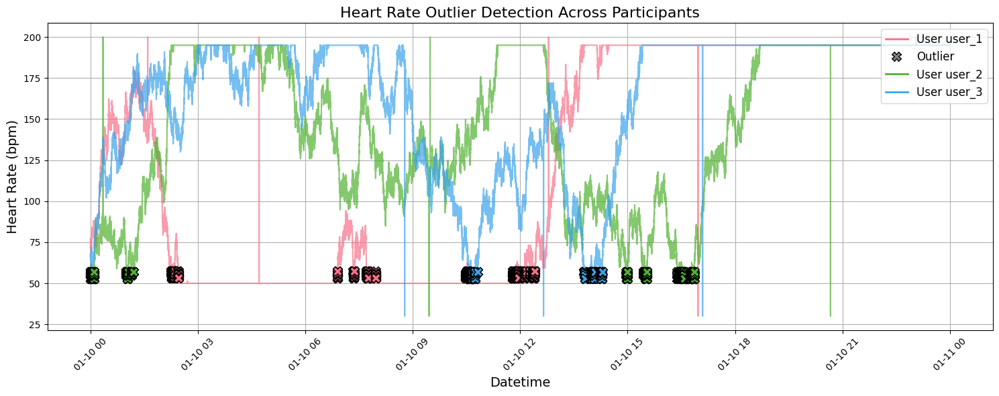

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# Ensure data is sorted
combined_hr_anomaly_single_day_df.sort_values(['user_id', 'datetime'], inplace=True)

# Define a color palette for different users
user_ids = combined_hr_anomaly_single_day_df['user_id'].unique()
colors = sns.color_palette('husl', n_colors=len(user_ids))
user_color_map = dict(zip(user_ids, colors))

# Prepare legend elements
legend_elements = []

plt.figure(figsize=(15, 6))

# Flag to ensure the outlier legend entry is added only once
outlier_legend_added = False

# Plot data for each user
for user_id in user_ids:
    user_color = user_color_map[user_id]
    user_data = combined_hr_anomaly_single_day_df[combined_hr_anomaly_single_day_df['user_id'] == user_id]

    # Normal data
    normal_data = user_data[user_data['anomaly_score'] != -1]
    plt.plot(
        normal_data['datetime'],
        normal_data['heart_rate'],
        label=f'User {user_id}',
        color=user_color,
        alpha=0.7
    )

    # Add user to legend
    legend_elements.append(Line2D([0], [0], color=user_color, lw=2, label=f'User {user_id}'))

    # Outliers
    outlier_data = user_data[user_data['anomaly_score'] == -1]
    if not outlier_data.empty:
        plt.scatter(
            outlier_data['datetime'],
            outlier_data['heart_rate'],
            color=user_color,
            s=100,  # Larger marker size
            marker='X',  # Different marker shape
            edgecolors='black',
            linewidths=1,
            zorder=5  # Plot above other elements
        )
        # Add outlier to legend once
        if not outlier_legend_added:
            legend_elements.append(Line2D(
                [0], [0],
                marker='X',
                color='w',
                label='Outlier',
                markerfacecolor='gray',
                markeredgecolor='black',
                markersize=10,
                linewidth=0
            ))
            outlier_legend_added = True

# Add titles and labels
plt.title('Heart Rate Outlier Detection Across Participants', fontsize=16)
plt.xlabel('Datetime', fontsize=14)
plt.ylabel('Heart Rate (bpm)', fontsize=14)
plt.xticks(rotation=45)

# Add the legend
plt.legend(handles=legend_elements, loc='upper right', fontsize=12)

# Add grid and layout adjustments
plt.grid(True)
plt.tight_layout()
plt.show()


### **2.8.3 Advanced Feature-Based Comparison: Heart Rate Variability (HRV) Analysis**

**Objective**

We aim to calculate Heart Rate Variability (HRV) metrics for each participant, compare these features across participants to detect outliers, and demonstrate advanced statistical and signal processing skills.

**Why HRV Analysis?**

Heart Rate Variability (HRV) measures the variation in time intervals between consecutive heartbeats, known as RR intervals. It is a significant indicator of autonomic nervous system activity, reflecting physiological resilience and stress levels. Lower HRV is associated with stress, fatigue, and certain health conditions. Analyzing HRV provides a sophisticated approach beyond basic heart rate measurements and aligns with our goal of showcasing statistical and machine learning skills.

**Data Preprocessing**

We begin by ensuring that the data is clean and free from artifacts, removing missing values and anomalies that could skew HRV calculations. Heart rate values outside the plausible physiological range (30 bpm to 200 bpm) are filtered out. The data is then resampled to a consistent frequency of one measurement per second to standardize it across all participants.

In [10]:
import numpy as np

# Dictionary to store anomaly-injected multi-day data for each user
users_hr_anomaly_multi_day_df = {}

for user_id, hr_df in users_hr_df.items():
    # Make a copy of the user's data to avoid modifying the original DataFrame
    hr_df_anomaly = hr_df.copy()

    # Inject anomalies
    # Randomly select 0.005% of rows in hr_df_anomaly
    sample_size = max(1, int(len(hr_df_anomaly) * 0.00005))
    sampled_rows = hr_df_anomaly.sample(n=sample_size)

    # Define a list of possible anomalous heart rate values
    anomalous_values = [200, 30]  # Values significantly higher or lower than normal

    # Assign anomalous values to the sampled rows
    sampled_rows['heart_rate'] = np.random.choice(anomalous_values, size=sample_size)

    # Update the heart rate values in the original DataFrame
    hr_df_anomaly.loc[sampled_rows.index, 'heart_rate'] = sampled_rows['heart_rate']

    # Store the DataFrame with anomalies
    users_hr_anomaly_multi_day_df[user_id] = hr_df_anomaly


In [11]:
import pandas as pd
import numpy as np

# Initialize a dictionary to store cleaned data for each user
users_hr_cleaned_df = {}

for user_id, hr_df in users_hr_anomaly_multi_day_df.items():
    hr_df = hr_df.copy()
    hr_df['datetime'] = pd.to_datetime(hr_df['datetime'])

    # Remove any duplicate timestamps
    hr_df = hr_df.drop_duplicates(subset='datetime')

    # Remove entries with missing heart rate values
    hr_df = hr_df.dropna(subset=['heart_rate'])

    # Remove heart rate values that are physiologically implausible (e.g., below 30 bpm or above 200 bpm)
    hr_df = hr_df[(hr_df['heart_rate'] >= 30) & (hr_df['heart_rate'] <= 200)]

    # Store the cleaned DataFrame
    users_hr_cleaned_df[user_id] = hr_df

In [12]:
# Resample to 1-second intervals
for user_id, hr_df in users_hr_cleaned_df.items():
    hr_df = hr_df.set_index('datetime').resample('1S').mean().interpolate('linear').reset_index()
    users_hr_cleaned_df[user_id] = hr_df


**Extracting RR Intervals**

We convert heart rate measurements (in beats per minute) to RR intervals (in milliseconds) using the formula:

`RR Interval (ms)`
=
60,000 /
`Heart Rate (bpm)`


This conversion is necessary because HRV analysis is based on the time intervals between heartbeats.

In [13]:
for user_id, hr_df in users_hr_cleaned_df.items():
    # Convert heart rate to RR intervals in milliseconds
    hr_df['rr_interval'] = 60000 / hr_df['heart_rate']
    users_hr_cleaned_df[user_id] = hr_df


**Calculating HRV Metrics**

We calculate time-domain HRV metrics such as **SDNN (standard deviation of NN intervals)** and **RMSSD (root mean square of successive differences)**, which reflect overall HRV and high-frequency variations, respectively. Additionally, we perform spectral analysis using **Welch's method** to compute frequency-domain metrics like LF (low frequency) and HF (high frequency) power, and the LF/HF ratio, which indicate autonomic balance.

In [14]:
hrv_features = []

for user_id, hr_df in users_hr_cleaned_df.items():
    rr_intervals = hr_df['rr_interval'].dropna().values

    if len(rr_intervals) < 2:
        print(f"Not enough RR interval data for {user_id}.")
        continue

    # Calculate SDNN
    sdnn = np.std(rr_intervals, ddof=1)

    # Calculate RMSSD
    rmssd = np.sqrt(np.mean(np.diff(rr_intervals) ** 2))

    hrv_features.append({
        'user_id': user_id,
        'SDNN': sdnn,
        'RMSSD': rmssd
    })


In [15]:
from scipy.signal import welch

for user_id, hr_df in users_hr_cleaned_df.items():
    rr_intervals = hr_df['rr_interval'].dropna().values

    # Calculate the instantaneous heart rate in Hz
    fs = 1  # Sampling frequency is 1 Hz after resampling
    fxx, pxx = welch(rr_intervals, fs=fs, nperseg=min(len(rr_intervals), 256))

    # Frequency bands
    lf_band = (fxx >= 0.04) & (fxx < 0.15)
    hf_band = (fxx >= 0.15) & (fxx < 0.4)

    # Calculate power in LF and HF bands
    lf_power = np.trapz(pxx[lf_band], fxx[lf_band])
    hf_power = np.trapz(pxx[hf_band], fxx[hf_band])

    # LF/HF ratio
    if hf_power == 0:
        lf_hf_ratio = np.nan
    else:
        lf_hf_ratio = lf_power / hf_power

    # Update existing entry in hrv_features
    for feature in hrv_features:
        if feature['user_id'] == user_id:
            feature.update({
                'LF_Power': lf_power,
                'HF_Power': hf_power,
                'LF/HF_Ratio': lf_hf_ratio
            })
            break


To enhance our analysis of heart rate variability (HRV), we utilize **Poincaré plots** to visualize the dynamics of RR intervals for each participant. A Poincaré plot is a scatter plot where each RR interval is plotted against the subsequent RR interval (i.e., RR<sub>n</sub> vs. RR<sub>n+1</sub>). This method provides a graphical representation of the correlation between consecutive heartbeats and helps assess the nonlinear aspects of HRV.

In the provided code, we iterate over each participant's cleaned heart rate data:

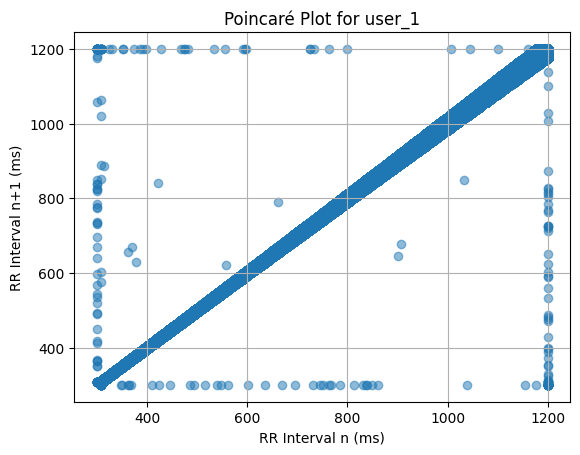

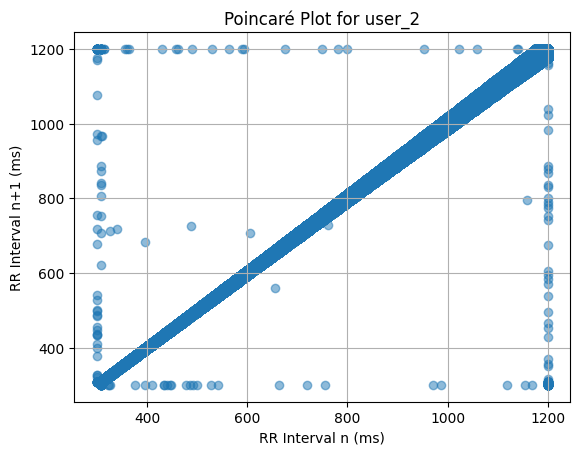

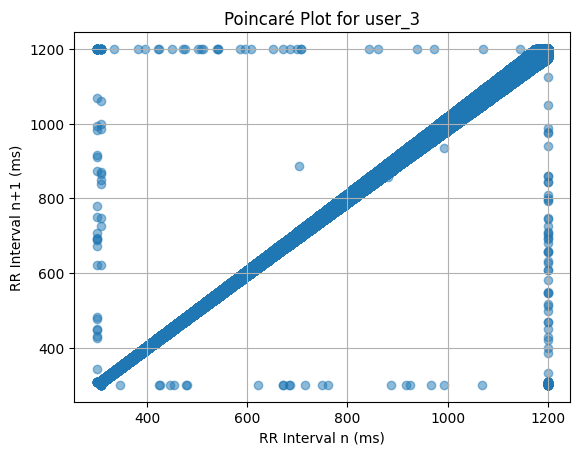

In [16]:
import matplotlib.pyplot as plt

for user_id, hr_df in users_hr_cleaned_df.items():
    rr_intervals = hr_df['rr_interval'].dropna().values

    if len(rr_intervals) < 2:
        continue

    # Create Poincaré plot
    plt.figure()
    plt.scatter(rr_intervals[:-1], rr_intervals[1:], alpha=0.5)
    plt.title(f'Poincaré Plot for {user_id}')
    plt.xlabel('RR Interval n (ms)')
    plt.ylabel('RR Interval n+1 (ms)')
    plt.grid(True)
    plt.show()


### **Interpretation**

*   **Shape Analysis:** The dispersion and shape of the points on the Poincaré plot provide insights into autonomic nervous system activity.

*   **Elliptical Shape**: Indicates normal HRV with balanced sympathetic and parasympathetic activity.

*   **Tighter Clustering:** Suggests reduced HRV, which may be associated with stress or certain health conditions.

*   **Increased Scatter:** Reflects higher HRV, potentially indicating good cardiovascular adaptability.


By utilizing **Poincaré plots**, we gain a deeper understanding of the complex fluctuations in heart rate beyond what linear metrics offer.

In [17]:
hrv_df = pd.DataFrame(hrv_features)

# Drop entries with missing values resulting from division by zero
hrv_df = hrv_df.dropna()


**Outlier Detection using Mahalanobis distance**

We apply multivariate outlier detection using the **Mahalanobis distance**, which considers the covariance among features to identify participants with significantly different HRV patterns. Statistical thresholds based on the chi-square distribution are used to determine if these deviations are significant.

In [18]:
from scipy.spatial.distance import mahalanobis
from scipy.stats import chi2

# Select features for outlier detection
features = ['SDNN', 'RMSSD', 'LF_Power', 'HF_Power', 'LF/HF_Ratio']

# Calculate the covariance matrix and its inverse
cov_matrix = np.cov(hrv_df[features].values.T)
inv_cov_matrix = np.linalg.pinv(cov_matrix)

# Calculate the mean vector
mean_vector = hrv_df[features].mean().values

# Compute Mahalanobis distance for each participant
hrv_df['Mahalanobis_Distance'] = hrv_df.apply(
    lambda row: mahalanobis(row[features].values, mean_vector, inv_cov_matrix),
    axis=1
)

# Determine the threshold (e.g., 95th percentile of the chi-square distribution)
threshold = chi2.ppf(0.95, df=len(features))
hrv_df['Outlier'] = hrv_df['Mahalanobis_Distance'] > np.sqrt(threshold)


Visualize Data

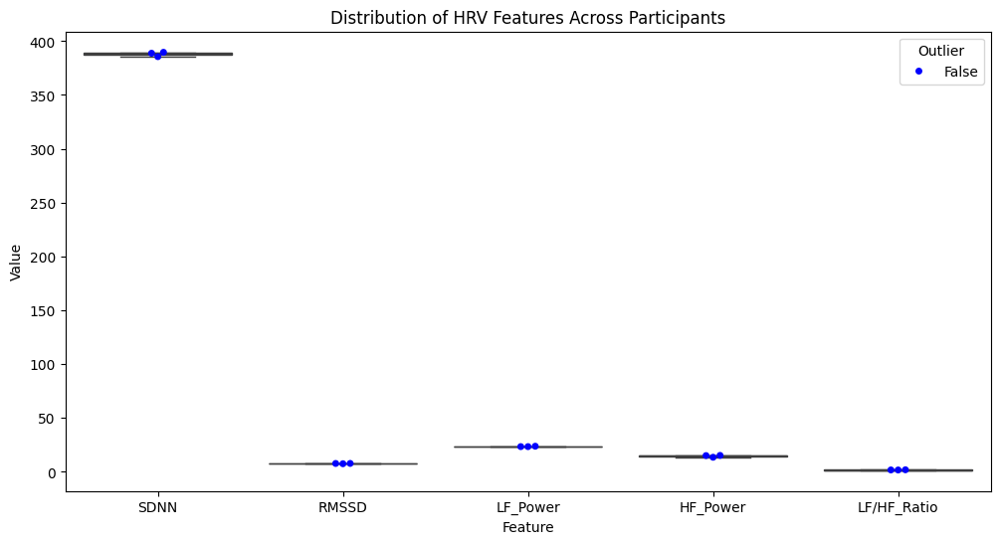

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame for easier plotting
hrv_melted = hrv_df.melt(id_vars=['user_id', 'Outlier'], value_vars=features, var_name='Feature', value_name='Value')

plt.figure(figsize=(12, 6))
sns.boxplot(x='Feature', y='Value', data=hrv_melted)
sns.swarmplot(x='Feature', y='Value', data=hrv_melted, hue='Outlier', dodge=False, palette={True: 'red', False: 'blue'})
plt.title('Distribution of HRV Features Across Participants')
plt.legend(title='Outlier', loc='upper right')
plt.show()


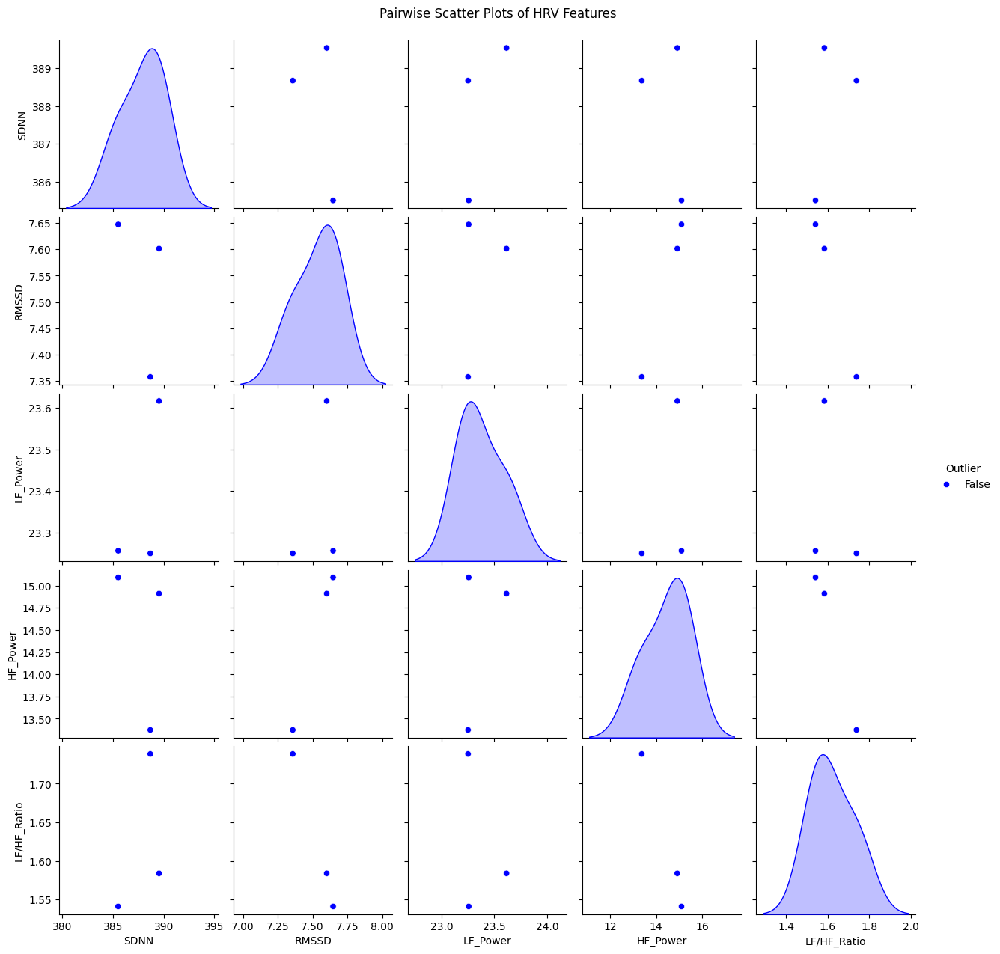

In [20]:
# Pairwise scatter plots of HRV features
sns.pairplot(hrv_df, vars=features, hue='Outlier', palette={True: 'red', False: 'blue'})
plt.suptitle('Pairwise Scatter Plots of HRV Features', y=1.02)
plt.show()


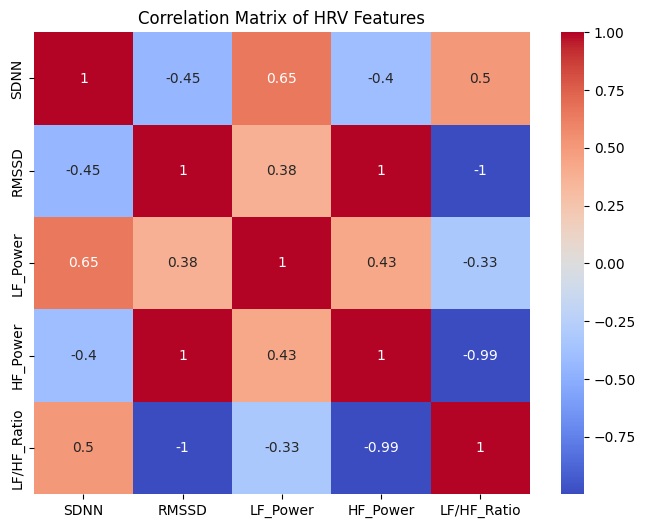

In [21]:
# Calculate the correlation matrix
corr_matrix = hrv_df[features].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of HRV Features')
plt.show()


### **2.9. Population-Level Data Analysis**

In this section, we will perform a population-level analysis to uncover patterns across multiple participants. Please do not use the analyses below as evidence supporting any scientific claims. These analyses are purely intended for educational purposes.

#### Breathing rate and SPO2 during sleep
Suppose we have a mini research question:

**Mini Research Question**: Can sleep apnea be identified by the joint distribution of blood oxygen saturation and breathing rate?

**Significance**: Sleep apnea is characterized by periods of low blood oxygen saturation accompanied by fluctuations in breathing rate. Analyzing the relationship between these two variables during sleep can provide valuable insights into the presence and severity of sleep apnea episodes.


#### **Step 1: Data Loading and Preparation**
We will extract the average SpO₂ values corresponding to the breathing rate during sleep for each user and merge the data into a single DataFrame for population-level analysis.

In [26]:
import pandas as pd

# Initialize a list to store data from all users
population_data = []

for user_id in users_data:
    # Extract SpO₂ data
    spo2_df = users_spo2_df[user_id].copy()
    spo2_df['date'] = spo2_df['minute'].dt.date
    day_spo2_df = spo2_df.groupby('date')['value'].mean().reset_index()
    day_spo2_df.columns = ['date', 'mean_spo2']
    day_spo2_df['date'] = pd.to_datetime(day_spo2_df['date'])

    # Extract sleep summary data (using 'fullSleepSummary' as a proxy)
    br_df = users_br_df[user_id].copy()
    br_df['date'] = br_df['datetime'].dt.date
    br_df['date'] = pd.to_datetime(br_df['date'])

    # Use 'fullSleepSummary' as 'mean_breath_rate' (adjust as appropriate)
    day_br_df = br_df[['date', 'fullSleepSummary']].copy()
    day_br_df.columns = ['date', 'mean_breath_rate']

    # Merge the two DataFrames on the 'date' column
    merged_df = pd.merge(day_spo2_df, day_br_df, on='date')

    # Add user ID to the DataFrame
    merged_df['user_id'] = user_id

    # Append to the population data list
    population_data.append(merged_df)

# Combine data from all users into a single DataFrame
population_df = pd.concat(population_data, ignore_index=True)

# Display the combined DataFrame
print(population_df.head())


        date  mean_spo2  mean_breath_rate user_id
0 2024-01-01  99.173118         15.460061  user_1
1 2024-01-02  98.940650         15.843738  user_1
2 2024-01-03  98.448157         14.338075  user_1
3 2024-01-04  97.090546         15.101175  user_1
4 2024-01-05  98.705787         16.068288  user_1


#### **Step 2: Inject Sleep Apnea Data**
Since our data simulates healthy individuals, we'll modify a proportion of data for each user to reflect patterns similar to a patient with sleep apnea.

In [ ]:
import numpy as np
import random

# Simulate sleep apnea in a subset of the population
num_apnea_records = int(0.15 * len(population_df))  # Simulate apnea in 15% of the records
apnea_indices = np.random.choice(population_df.index, num_apnea_records, replace=False)

for i in apnea_indices:
    # Lower SpO₂ to simulate apnea (values between 85% and 95%)
    population_df.at[i, 'mean_spo2'] = random.uniform(85, 95)
    # Adjust 'mean_breath_rate' to simulate apnea (e.g., lower values)
    population_df.at[i, 'mean_breath_rate'] = random.uniform(10, 16)


#### **Step 3: Population-Level Clustering Analysis**
We will apply clustering techniques to the combined dataset to identify patterns and potentially detect groups indicative of sleep apnea.

In [27]:
# Prepare the data for clustering
X = population_df[['mean_spo2', 'mean_breath_rate']].copy()

# Handle any missing values
X = X.dropna()

# Standardize the data (optional but recommended)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


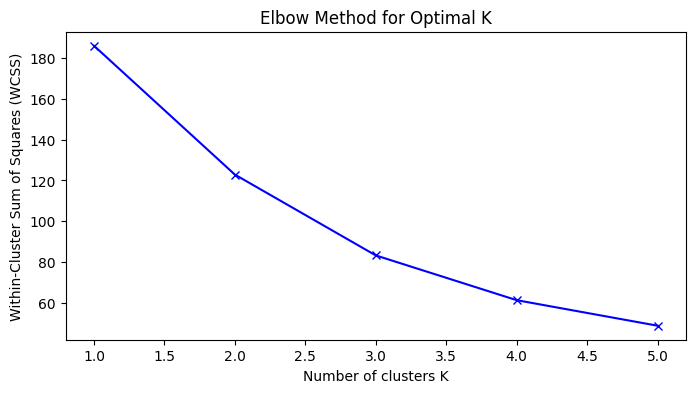

In [28]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Determine the optimal number of clusters using the Elbow Method
wcss = []
K = range(1, 6)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(8, 4))
plt.plot(K, wcss, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal K')
plt.show()


**Elbow Method**: Helps in selecting the optimal number of clusters by plotting WCSS against different values of K.

**WCSS**: Measures the variance within clusters; a lower WCSS indicates tighter clusters.

Based on the Elbow Method plot, we choose the number of clusters where the decrease in WCSS begins to level off. For simplicity, we'll proceed with **K=2**

In [33]:
# Apply KMeans clustering with K=2
kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
population_df['cluster'] = kmeans.fit_predict(X_scaled)


In [34]:
# Examine the characteristics of each cluster
cluster_summary = population_df.groupby('cluster')[['mean_spo2', 'mean_breath_rate']].mean().reset_index()
print(cluster_summary)


   cluster  mean_spo2  mean_breath_rate
0        0  97.065085         14.740687
1        1  97.994630         15.953588


#### **Step 4: Visualize Population-Level Patterns**

Visualization aids in understanding the clustering results and the distribution of data across the population.

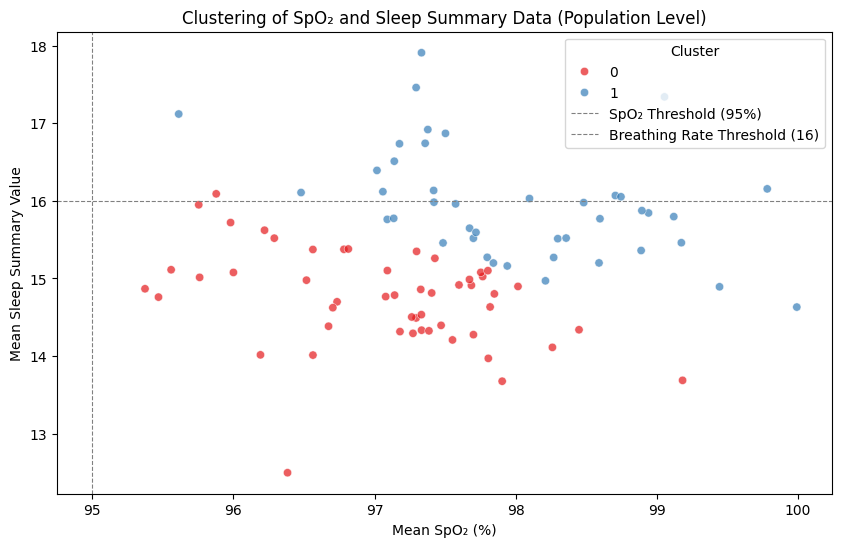

In [35]:
import seaborn as sns

# Create a scatter plot with clusters
plt.figure(figsize=(10, 6))
palette = sns.color_palette('Set1', n_colors=2)
sns.scatterplot(
    data=population_df,
    x='mean_spo2',
    y='mean_breath_rate',
    hue='cluster',
    palette=palette,
    alpha=0.7
)

# Add threshold lines (adjust thresholds as appropriate)
plt.axvline(x=95, color='gray', linestyle='--', linewidth=0.8, label='SpO₂ Threshold (95%)')
plt.axhline(y=16, color='gray', linestyle='--', linewidth=0.8, label='Breathing Rate Threshold (16)')

plt.title('Clustering of SpO₂ and Sleep Summary Data (Population Level)')
plt.xlabel('Mean SpO₂ (%)')
plt.ylabel('Mean Sleep Summary Value')
plt.legend(title='Cluster')
plt.show()


In [36]:
# Identify users in the potential sleep apnea cluster
apnea_cluster = 1  # Assuming cluster 1 indicates potential sleep apnea
apnea_cases = population_df[population_df['cluster'] == apnea_cluster]['user_id'].unique()

print(f"Users potentially affected by sleep apnea: {apnea_cases}")


Users potentially affected by sleep apnea: ['user_1' 'user_2' 'user_3']


To further investigate, we can plot the time series of SpO₂ and breathing rate for users identified as potential sleep apnea cases.

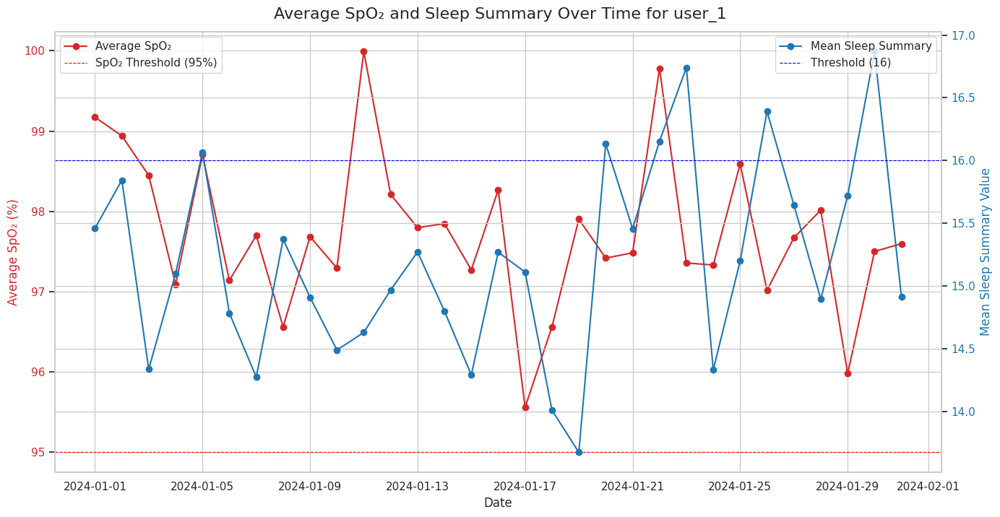

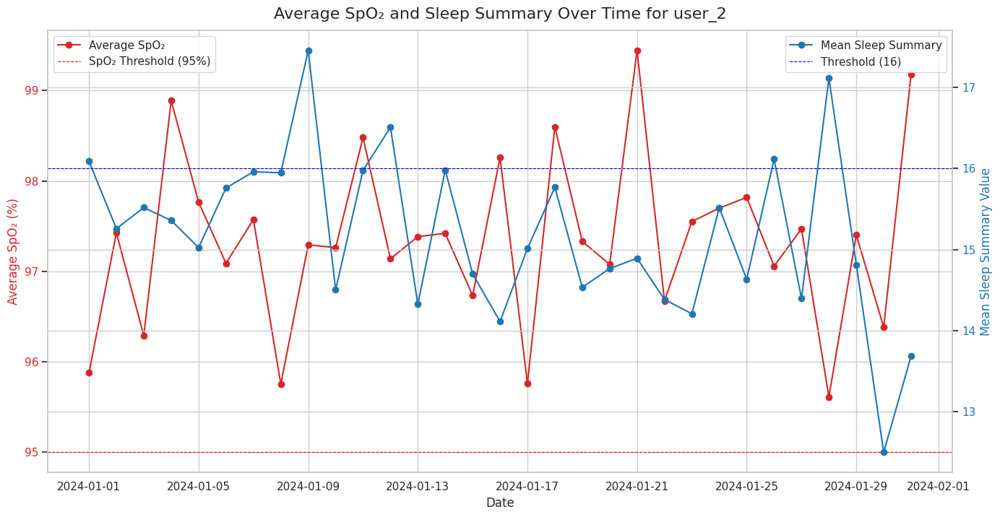

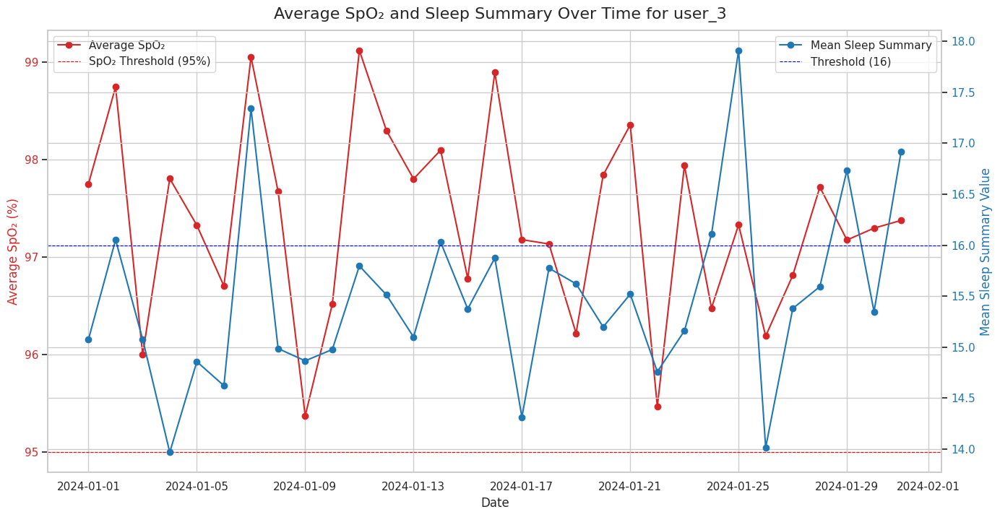

In [37]:
for user_id in apnea_cases:
    user_data = population_df[population_df['user_id'] == user_id]

    sns.set(style="whitegrid")
    fig, ax1 = plt.subplots(figsize=(14, 7))

    # Plot Average SpO₂
    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Average SpO₂ (%)', color=color)
    ax1.plot(user_data['date'], user_data['mean_spo2'], color=color, marker='o', label='Average SpO₂')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.axhline(y=95, color='red', linestyle='--', linewidth=0.8, label='SpO₂ Threshold (95%)')

    # Plot 'Mean Breathing Rate' (using 'fullSleepSummary')
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Mean Sleep Summary Value', color=color)
    ax2.plot(user_data['date'], user_data['mean_breath_rate'], color=color, marker='o', label='Mean Sleep Summary')
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.axhline(y=16, color='blue', linestyle='--', linewidth=0.8, label='Threshold (16)')

    fig.tight_layout()
    fig.suptitle(f'Average SpO₂ and Sleep Summary Over Time for {user_id}', y=1.02, fontsize=16)
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')

    plt.show()


#### **Breathing Rates at Different Sleep Stages**

We might also be interested in whether breathing rates change during different sleep stages. We'll plot histograms to visualize the distribution of breathing rates for each sleep stage and perform statistical analysis.

The following is our approach for each user:

- **Plot Histograms:** Visualize the distribution of breathing rates for deep sleep, REM sleep, and light sleep stages.
- **Calculate Statistics:** Compute the mean and standard deviation for each sleep stage.
- **Perform ANOVA:** Determine if the differences between sleep stages are statistically significant.
- **Visualize with Mean Values:** Update histograms to include mean values.

In [38]:
import pandas as pd

# Initialize a list to store DataFrames from all users
br_data_list = []

# Iterate over all users to collect data
for user_id, br_df in users_br_df.items():
    # Select the relevant columns
    df = br_df[['deepSleepSummary', 'remSleepSummary', 'lightSleepSummary']].copy()
    # Add user ID for reference (optional)
    df['user_id'] = user_id
    # Append to the list
    br_data_list.append(df)

# Concatenate all DataFrames into one
br_data_combined = pd.concat(br_data_list, ignore_index=True)

# Display the first few rows of the combined DataFrame
print(br_data_combined.head())


   deepSleepSummary  remSleepSummary  lightSleepSummary user_id
0         12.484795        17.286336          16.609053  user_1
1         15.829268        16.170028          15.531919  user_1
2         13.391906        13.979346          15.642975  user_1
3         12.912303        14.640428          17.750795  user_1
4         13.859969        16.104277          18.240617  user_1


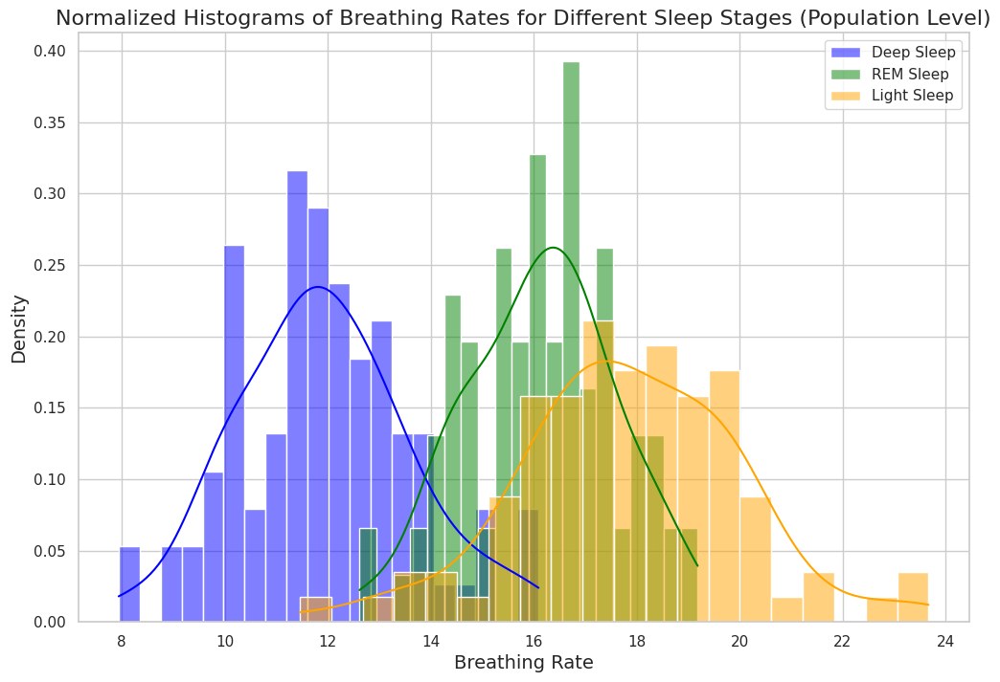

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))

# Plot histograms for each sleep stage
sns.histplot(br_data_combined['deepSleepSummary'], bins=20, kde=True, label='Deep Sleep', color='blue', stat='density')
sns.histplot(br_data_combined['remSleepSummary'], bins=20, kde=True, label='REM Sleep', color='green', stat='density')
sns.histplot(br_data_combined['lightSleepSummary'], bins=20, kde=True, label='Light Sleep', color='orange', stat='density')

plt.title('Normalized Histograms of Breathing Rates for Different Sleep Stages (Population Level)', fontsize=16)
plt.xlabel('Breathing Rate', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend()
plt.show()


Let us also look into the mean and standard deviation of breathing rates for each of the sleep stages.

In [40]:
# Calculate statistics for deep sleep
deep_sleep_mean = br_data_combined['deepSleepSummary'].mean()
deep_sleep_std = br_data_combined['deepSleepSummary'].std()

# Calculate statistics for REM sleep
rem_sleep_mean = br_data_combined['remSleepSummary'].mean()
rem_sleep_std = br_data_combined['remSleepSummary'].std()

# Calculate statistics for light sleep
light_sleep_mean = br_data_combined['lightSleepSummary'].mean()
light_sleep_std = br_data_combined['lightSleepSummary'].std()

# Print the results
print("Population-Level Statistics:")
print(f"Deep Sleep - Mean: {deep_sleep_mean:.2f}, Std Dev: {deep_sleep_std:.2f}")
print(f"REM Sleep - Mean: {rem_sleep_mean:.2f}, Std Dev: {rem_sleep_std:.2f}")
print(f"Light Sleep - Mean: {light_sleep_mean:.2f}, Std Dev: {light_sleep_std:.2f}")


Population-Level Statistics:
Deep Sleep - Mean: 11.89, Std Dev: 1.67
REM Sleep - Mean: 16.12, Std Dev: 1.43
Light Sleep - Mean: 17.85, Std Dev: 2.14


For distributions like this one, we can use Analysis of Variance (ANOVA) to determine if the distributions are significantly distinct.

### Analysis of Variance (ANOVA)

Analysis of Variance (ANOVA) is a statistical method used to compare means between two or more groups. It assesses whether there are significant differences in the means of groups based on the variance observed in their measurements.

ANOVA assesses the null hypothesis that all groups have the same mean. It calculates an F-statistic by dividing the variance between the groups (explained variance) by the variance within the groups (unexplained variance). If the F-statistic is large enough to reject the null hypothesis, it indicates that at least one group mean is significantly different from the others.

$$F = \frac{\text{Between-group variability}}{\text{Within-group variability}} $$

Here, we can simly input our three distributions into the `f_oneway` function from `scipy.stats` and inspect the resulting p-value. If the p-value is less than 0.05, it indicates that there is a significant difference between sleep stages.

#### **Performing ANOVA**

In [41]:
from scipy.stats import f_oneway

# Perform one-way ANOVA
anova_result = f_oneway(
    br_data_combined['deepSleepSummary'],
    br_data_combined['remSleepSummary'],
    br_data_combined['lightSleepSummary']
)

# Print ANOVA results
print("\nOne-way ANOVA Results:")
print(f"F-value: {anova_result.statistic:.4f}")
print(f"P-value: {anova_result.pvalue:.4f}")

# Interpret the results
alpha = 0.05  # Significance level
if anova_result.pvalue < alpha:
    print("Reject the null hypothesis: There is a significant difference between sleep stages.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference between sleep stages.")




One-way ANOVA Results:
F-value: 278.9484
P-value: 0.0000
Reject the null hypothesis: There is a significant difference between sleep stages.


#### **Visualize with Mean Values**

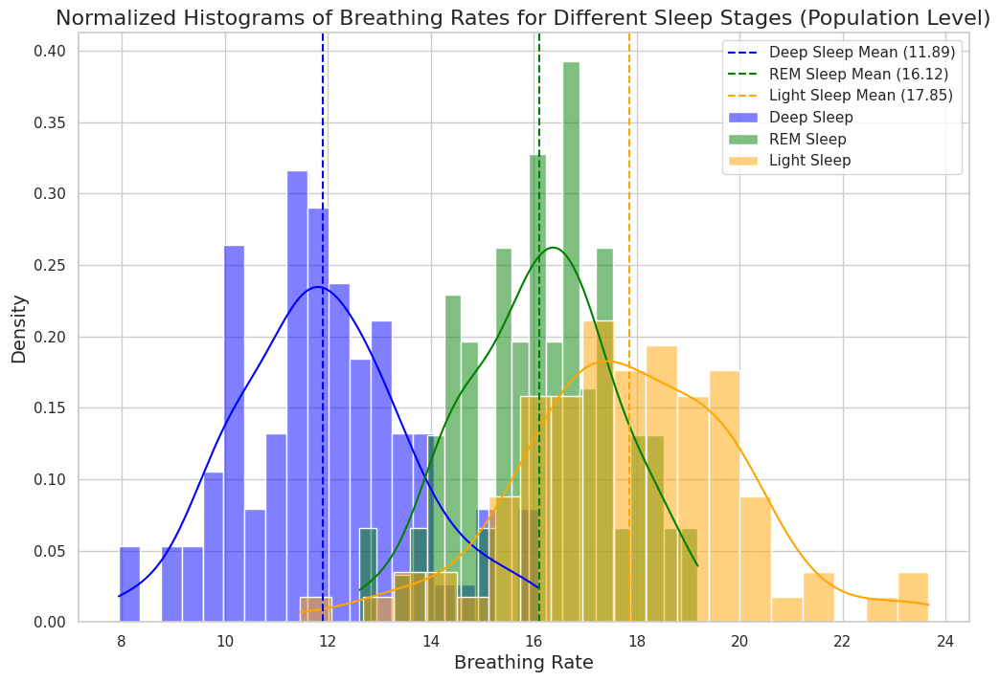

In [42]:
plt.figure(figsize=(12, 8))

# Plot histograms for each sleep stage
sns.histplot(br_data_combined['deepSleepSummary'], bins=20, kde=True, label='Deep Sleep', color='blue', stat='density')
sns.histplot(br_data_combined['remSleepSummary'], bins=20, kde=True, label='REM Sleep', color='green', stat='density')
sns.histplot(br_data_combined['lightSleepSummary'], bins=20, kde=True, label='Light Sleep', color='orange', stat='density')

# Add vertical lines for mean values
plt.axvline(x=deep_sleep_mean, color='blue', linestyle='--', linewidth=1.5, label=f'Deep Sleep Mean ({deep_sleep_mean:.2f})')
plt.axvline(x=rem_sleep_mean, color='green', linestyle='--', linewidth=1.5, label=f'REM Sleep Mean ({rem_sleep_mean:.2f})')
plt.axvline(x=light_sleep_mean, color='orange', linestyle='--', linewidth=1.5, label=f'Light Sleep Mean ({light_sleep_mean:.2f})')

plt.title('Normalized Histograms of Breathing Rates for Different Sleep Stages (Population Level)', fontsize=16)
plt.xlabel('Breathing Rate', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend()
plt.show()


The p-value is less than 0.05, thus we can reject our original null hypothesis. This suggests that there is a correlation between breathing rate and sleep stage.

This result makes sense because the deep sleep stage typically involves slower and more regular breathing patterns, resulting in a lower mean breathing rate with relatively low variability. Conversely, the REM sleep stage involves rapid eye movements and vivid dreaming, exhibits a higher mean breathing rate along with a slightly higher standard deviation, reflecting the intermittent nature of breathing during this stage. Lastly, light sleep, which acts as a transition between deep sleep and wakefulness, displays an intermediate mean breathing rate and standard deviation.

Lastly, please be mindful that the data presented and any subsequent results are purely synthetic and intended only for demonstrative purposes. They do not reflect real biological data or clinical findings. This synthetic approach is only used to illustrate data processing, visualization, and analytical techniques.